# Temporal Convolutional Network

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
%cd /content/gdrive/My Drive/pump-data/

/content/gdrive/My Drive/pump-data


In [ ]:
!ls

allpumps_tcn_v1.pth.tar       sng_dataset_v1.csv
allpumps_tcn_v1.pth.tar.ckpt  sng_dataset_v1_valid1.csv
allpumps_transformer.pth.tar  sng_dataset_v1_valid1.gsheet
clean_train.csv		      sng_dataset_v1_valid2.csv
darts_logs		      test_results.csv
pumps_split		      valid_results.csv


In [ ]:
!pip install matplotlib
!pip install darts

In [ ]:
EPOCH = 100


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

from darts.dataprocessing.transformers import Scaler
from darts.models import RNNModel, Theta, TCNModel
from darts.metrics import mape, rmse, r2_score
from darts.utils.statistics import check_seasonality, plot_acf, plot_hist
from darts.utils.timeseries_generation import datetime_attribute_timeseries

from darts.datasets import SunspotsDataset, AirPassengersDataset

import sys
import time
import warnings
warnings.filterwarnings("ignore")
import logging
logging.disable(logging.CRITICAL)


FC_N = 12               # forecast periods
FC_STRIDE = 10
FC_START = '2019-07-25 00:00:00'   # period at which to split training and validation dataset
DROP = 0.1
LEARN = 0.001

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from darts import TimeSeries
from darts.models import TCNModel, RNNModel
from darts.dataprocessing.transformers import Scaler
from darts.utils.timeseries_generation import datetime_attribute_timeseries
from darts.metrics import mape, r2_score
from darts.utils.missing_values import fill_missing_values
from darts.datasets import AirPassengersDataset, SunspotsDataset, EnergyDataset

In [ ]:
from darts.dataprocessing.transformers import Scaler, MissingValuesFiller, Mapper, InvertibleMapper


In [ ]:
data_address = '/content/gdrive/My Drive/pump-data'
training = pd.read_csv(data_address +'/sng_dataset_v1.csv', index_col=False)
training.drop(['Unnamed: 0', 'MIDUPT1138P2300058', 'SHORTUPT1138P2300058', 'LONGUPT1138P2300058', 'DMIDT1138P2300058',  'DLONGT1138P2300058', 'UNIXDT', 'UUID'], axis=1, inplace=True)

In [ ]:
training.columns

Index(['WELL_ID', 'DT', 'T1138P6000096', 'T1138P6000315', 'DMIDT1138P4000064',
       'DSHORTT1138P4000064', 'DLONGT1138P4000064', 'DMIDT1138P2600012',
       'DSHORTT1138P2600012', 'DLONGT1138P2600012', 'DMIDT1205P2300000',
       'DSHORTT1205P2300000', 'DLONGT1205P2300000', 'T1205P2300000',
       'T1138P4000064', 'T1138P2600012', 'T1138P600050', 'T1013P500399',
       'DSHORTT1138P2300058'],
      dtype='object')

In [ ]:
only_1_bad = training[training['WELL_ID'] == 226003316].copy()


In [ ]:
only_1_bad.DT

,DT
9990,2019-07-31 23:55:00
9991,2019-07-31 23:50:00
9992,2019-07-31 23:45:00
9993,2019-07-31 23:40:00
9994,2019-07-31 23:35:00
...,...
19972,2019-06-27 07:00:00
19973,2019-06-27 06:55:00
19974,2019-06-27 06:50:00
19975,2019-06-27 06:45:00


## подготовим данные для всех насосов

In [ ]:
from sklearn.preprocessing import LabelBinarizer

pump_encoder = LabelBinarizer()
transformed = pump_encoder.fit_transform(training.WELL_ID)
ohe_df = pd.DataFrame(transformed)
ohe_df.columns = pump_encoder.classes_
ohe_df.columns = ohe_df.columns.astype(str)

training_oh = pd.concat([training, ohe_df], axis=1).drop(['WELL_ID'], axis=1)
training_oh.columns = training_oh.columns.astype(str)

training_oh

,DT,T1138P6000096,T1138P6000315,DMIDT1138P4000064,DSHORTT1138P4000064,DLONGT1138P4000064,DMIDT1138P2600012,DSHORTT1138P2600012,DLONGT1138P2600012,DMIDT1205P2300000,...,226002307,226002416,226002603,226002627,226002861,226002998,226003074,226003080,226003316,226003330
0,2019-07-31 23:55:00,300,0,-2.150755,0.0,-2.290611,-0.279070,0.0,-0.313752,-0.001102,...,0,0,0,0,0,0,0,0,0,1
1,2019-07-31 23:50:00,0,0,-2.172480,0.0,-2.292904,-0.281889,0.0,-0.314066,-0.001172,...,0,0,0,0,0,0,0,0,0,1
2,2019-07-31 23:45:00,0,28500,-2.172480,0.0,-2.292904,-0.281889,0.0,-0.314066,-0.001172,...,0,0,0,0,0,0,0,0,0,1
3,2019-07-31 23:40:00,0,28200,-2.172480,0.0,-2.292904,-0.281889,0.0,-0.314066,-0.001172,...,0,0,0,0,0,0,0,0,0,1
4,2019-07-31 23:35:00,0,27900,-2.172480,0.0,-2.292904,-0.281889,0.0,-0.314066,-0.001172,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160257,2019-06-27 07:00:00,0,14400,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,...,0,0,0,0,0,0,0,0,0,0
160258,2019-06-27 06:55:00,0,14100,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,...,0,0,0,0,0,0,0,0,0,0
160259,2019-06-27 06:50:00,0,13800,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,...,0,0,0,0,0,0,0,0,0,0
160260,2019-06-27 06:45:00,0,13500,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,...,0,0,0,0,0,0,0,0,0,0


реализовать нарезку на train-test


In [ ]:
def get_pump_names(df):
  """
  вытаскиваем set из колонок по df, который подали
  """
  values = df.columns
  return set(values)


def split_df_by_pumps(input_df, ohe_df):
  """
  input_df: дф, в котором есть колонки onehot с насовами
  ohe_df: дф onehot для насосов
  выдает 17 штук train set
  """

  pump_ids = get_pump_names(ohe_df)
  df_list = list()

  for pump in pump_ids:
    df_list.append(input_df[input_df[pump] == 1])

  return df_list



реализовать нарезку на файлы по названию насосов

In [ ]:
data_address

'/content/gdrive/My Drive/pump-data'

In [ ]:
def save_pumps_to_files(input_df, ohe_df, output_dir= 'pumps_split'):
    """
    input_df: дф, в котором есть колонки onehot с насовами
    ohe_df: дф onehot для насосов
    выдает 17 файлов по названию насосов
    """
    import os
    os.makedirs(output_dir, exist_ok=True)
    pump_ids = get_pump_names(ohe_df)

    for pump in pump_ids:
        pump_df = input_df[input_df[pump] == 1].copy()
        filename = f"{output_dir}/pump_{pump}.csv"
        pump_df.to_csv(filename, index=False)
        print(f"Сохранён файл: {filename}, строк: {len(pump_df)}")

In [ ]:
save_pumps_to_files(training_oh, ohe_df)

Сохранён файл: pumps_split/pump_226002627.csv, строк: 9992
Сохранён файл: pumps_split/pump_226002307.csv, строк: 9607
Сохранён файл: pumps_split/pump_226002148.csv, строк: 3180
Сохранён файл: pumps_split/pump_226002861.csv, строк: 9987
Сохранён файл: pumps_split/pump_226002603.csv, строк: 9706
Сохранён файл: pumps_split/pump_226000198.csv, строк: 9981
Сохранён файл: pumps_split/pump_226002142.csv, строк: 9997
Сохранён файл: pumps_split/pump_226001846.csv, строк: 9990
Сохранён файл: pumps_split/pump_226001947.csv, строк: 9987
Сохранён файл: pumps_split/pump_226002998.csv, строк: 8725
Сохранён файл: pumps_split/pump_226000188.csv, строк: 9975
Сохранён файл: pumps_split/pump_226003074.csv, строк: 9578
Сохранён файл: pumps_split/pump_226003080.csv, строк: 9600
Сохранён файл: pumps_split/pump_226003330.csv, строк: 9990
Сохранён файл: pumps_split/pump_226000297.csv, строк: 9998
Сохранён файл: pumps_split/pump_226002416.csv, строк: 9982
Сохранён файл: pumps_split/pump_226003316.csv, строк: 99

find when to split?

In [ ]:
only_1_bad['DT'] = pd.to_datetime(only_1_bad['DT'] )

print(only_1_bad.DT.min()-
      only_1_bad.DT.max())

only_1_bad.DT.min() + (only_1_bad.DT.max() - only_1_bad.DT.min()) * 0.8

-35 days +06:45:00


Timestamp('2019-07-25 01:16:00')

In [ ]:
series = TimeSeries.from_dataframe(only_1_bad, 'DT', fill_missing_dates=True, freq=None)


In [ ]:
scaler = Scaler()
ts = scaler.fit_transform(series)  # scale the whole time series not caring about train/val split...
filler = MissingValuesFiller()
ts = filler.transform(ts, method='quadratic')
target = ts['DSHORTT1138P2300058']
# Create training and validation sets:
train_target, val_target = target.split_after(pd.Timestamp(FC_START))

covariates = ts[['WELL_ID', 'T1138P6000096', 'T1138P6000315', 'DMIDT1138P4000064',
       'DSHORTT1138P4000064', 'DLONGT1138P4000064', 'DMIDT1138P2600012',
       'DSHORTT1138P2600012', 'DLONGT1138P2600012', 'DMIDT1205P2300000',
       'DSHORTT1205P2300000', 'DLONGT1205P2300000', 'T1205P2300000',
       'T1138P4000064', 'T1138P2600012', 'T1138P600050', 'T1013P500399']]

train_cov, val_cov = covariates.split_after(pd.Timestamp(FC_START))
train_1cov, val_1cov = covariates['T1138P600050'].split_after(pd.Timestamp(FC_START))

<Axes: xlabel='DT'>

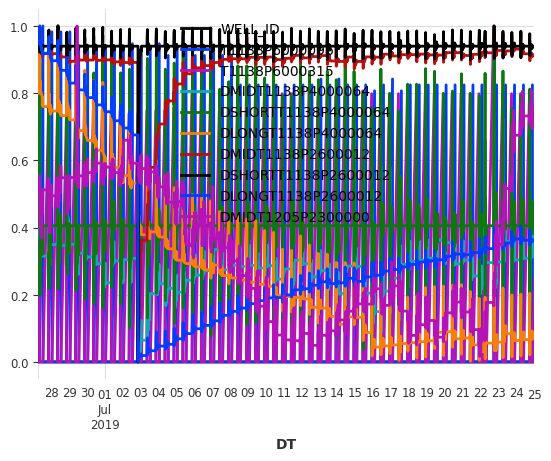

In [ ]:
train_cov.plot()

<Axes: xlabel='DT'>

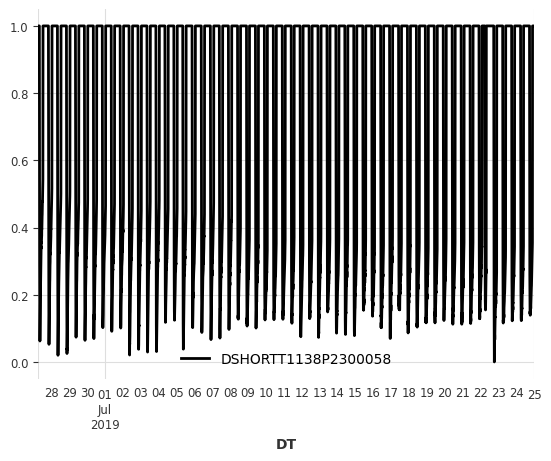

In [ ]:
train_target.plot()

In [ ]:
train_1cov.freq

<5 * Minutes>

In [ ]:
train_1cov.to_dataframe()

,T1138P600050
DT,
2019-06-27 06:40:00,0.0
2019-06-27 06:45:00,0.0
2019-06-27 06:50:00,0.0
2019-06-27 06:55:00,0.0
2019-06-27 07:00:00,0.0
...,...
2019-07-24 23:40:00,0.0
2019-07-24 23:45:00,0.0
2019-07-24 23:50:00,0.0


In [ ]:
train_target.values()


array([[1.],
       [1.],
       [1.],
       ...,
       [1.],
       [1.],
       [1.]])

In [ ]:
train_target

,DSHORTT1138P2300058
DT,
2019-06-27 06:40:00,1.0
2019-06-27 06:45:00,1.0
2019-06-27 06:50:00,1.0
2019-06-27 06:55:00,1.0
2019-06-27 07:00:00,1.0
...,...
2019-07-24 23:40:00,1.0
2019-07-24 23:45:00,1.0
2019-07-24 23:50:00,1.0


<Axes: xlabel='DT'>

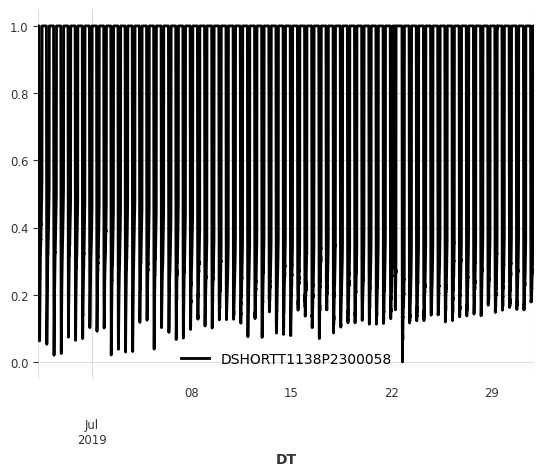

In [ ]:
target.plot()

<Axes: xlabel='DT'>

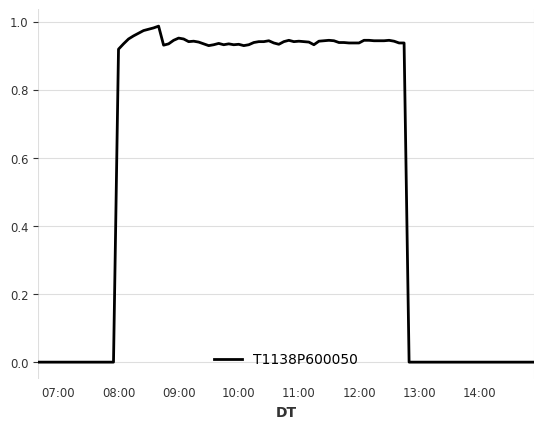

In [ ]:
train_1cov[:100].plot()

In [ ]:
# analyze its seasonality

is_seasonal, periodicity = check_seasonality(target, max_lag=1000)
dict_seas ={
    "is seasonal?":is_seasonal,
    "periodicity (5*minutes)":f'{periodicity:.1f}',
    "periodicity (hours)":f'{periodicity/12:.1f}'}
_ = [print(k,":",v) for k,v in dict_seas.items()]

is seasonal? : True
periodicity (5*minutes) : 144.0
periodicity (hours) : 12.0


In [ ]:
import statsmodels.api as sm

<Axes: xlabel='DT'>

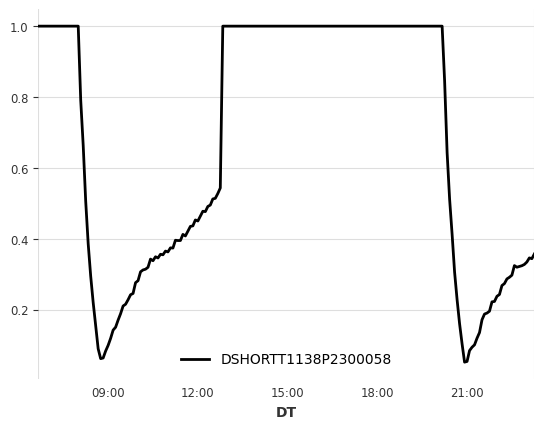

In [ ]:
target['DSHORTT1138P2300058'][:200].plot()

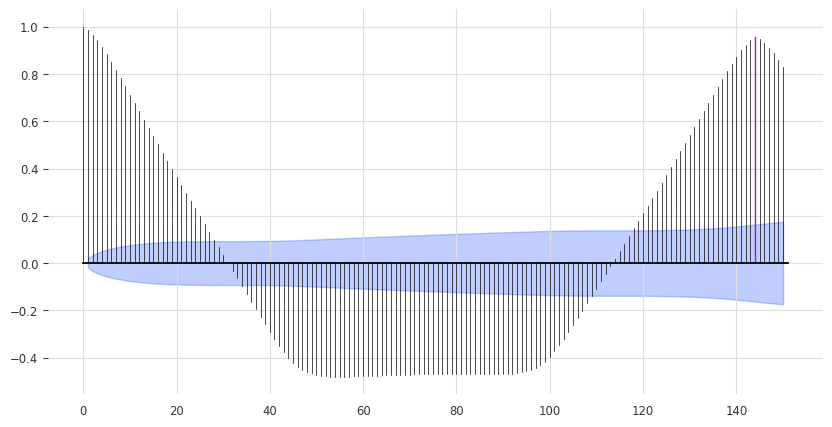

In [ ]:
plot_acf(target, periodicity, max_lag=150)


In [ ]:
target.values()

array([[1.],
       [1.],
       [1.],
       ...,
       [1.],
       [1.],
       [1.]])

In [ ]:
from darts.models import RNNModel, TCNModel, TransformerModel, NBEATSModel, BlockRNNModel
from darts.metrics import mape, smape, mae


# lets do a simple one

In [ ]:
one_var = covariates['T1205P2300000'].copy()

<Axes: xlabel='DT'>

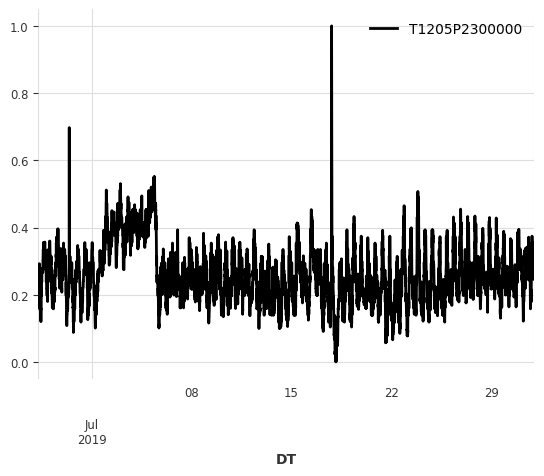

In [ ]:
one_var.plot()

In [ ]:
train_cov1, val_cov1 = one_var.split_after(pd.Timestamp('2019-07-25 00:00:00'))

<Axes: xlabel='DT'>

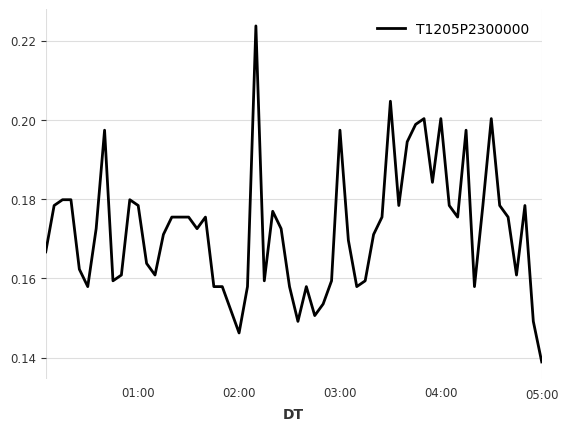

In [ ]:
val_cov1[:60].plot()

In [ ]:
val_cov1.time_index

DatetimeIndex(['2019-07-25 00:05:00', '2019-07-25 00:10:00',
               '2019-07-25 00:15:00', '2019-07-25 00:20:00',
               '2019-07-25 00:25:00', '2019-07-25 00:30:00',
               '2019-07-25 00:35:00', '2019-07-25 00:40:00',
               '2019-07-25 00:45:00', '2019-07-25 00:50:00',
               ...
               '2019-07-31 23:10:00', '2019-07-31 23:15:00',
               '2019-07-31 23:20:00', '2019-07-31 23:25:00',
               '2019-07-31 23:30:00', '2019-07-31 23:35:00',
               '2019-07-31 23:40:00', '2019-07-31 23:45:00',
               '2019-07-31 23:50:00', '2019-07-31 23:55:00'],
              dtype='datetime64[ns]', name='DT', length=2015, freq='5min')

In [ ]:
model_1var = TCNModel(
    input_chunk_length=24,
    output_chunk_length=2,
    n_epochs=EPOCH,
    dropout=0.01,
    dilation_base=2,
    weight_norm=True,
    kernel_size=5,
    num_filters=3,
    random_state=0
)

In [ ]:
model_1var.fit(series=train_target,
              past_covariates=train_cov1,
              val_series=val_target,
              val_past_covariates=val_cov1,
              verbose=True)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

TCNModel(output_chunk_shift=0, kernel_size=5, num_filters=3, num_layers=None, dilation_base=2, weight_norm=True, dropout=0.01, input_chunk_length=24, output_chunk_length=2, n_epochs=100, random_state=0)

In [ ]:
backtest_1var = model_1var.historical_forecasts(series=val_target,
                                                past_covariates=val_cov1, start=0.1,
                                            retrain=False,
                                            verbose=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score


def smape(y_true, y_pred):
    return 2.0 * np.mean(np.abs(y_pred - y_true) / (np.abs(y_pred) + np.abs(y_true)))


In [ ]:
val_target_inters = val_target.slice_intersect(backtest_1var)

MAPE = 0.06%
MAE = 0.03
smape = 0.06%
R2 = 0.95%


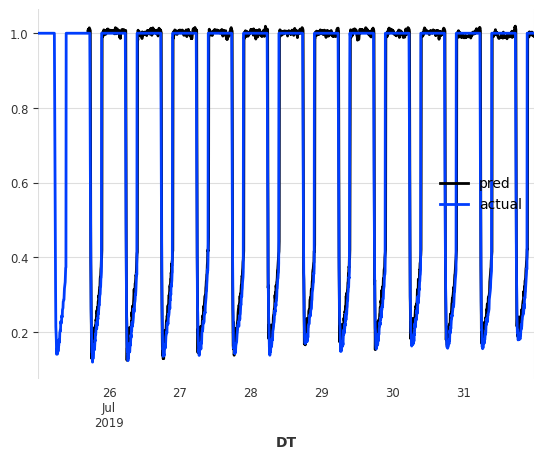

In [ ]:
backtest_1var.plot(label='pred')
val_target.plot(label='actual')
plt.legend();
print('MAPE = {:.2f}%'.format(mean_absolute_percentage_error(val_target_inters.values(), backtest_1var.values())))
print('MAE = {:.2f}'.format(mae(val_target_inters, backtest_1var)))
print('smape = {:.2f}%'.format(smape(val_target_inters.values(), backtest_1var.values())))
print('R2 = {:.2f}%'.format(r2_score(val_target_inters.values(), backtest_1var.values())))


<Axes: xlabel='DT'>

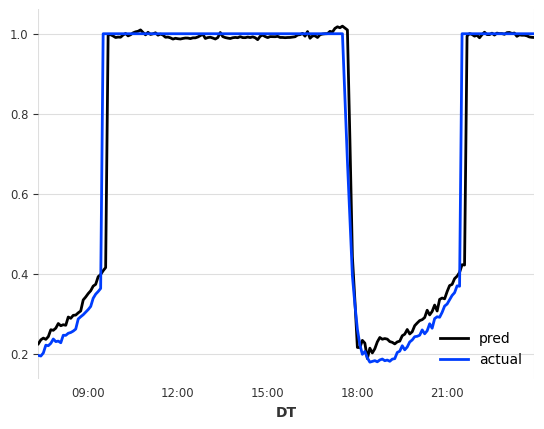

In [ ]:
backtest_1var[-200:].plot(label='pred')
val_target[-200:].plot(label='actual')


## do with all covariates for 1 pump

In [ ]:
model_1pump = TCNModel(
    input_chunk_length=144,
    output_chunk_length=1,
    n_epochs=EPOCH,
    dropout=0.01,
    dilation_base=2,
    weight_norm=True,
    kernel_size=5,
    num_filters=3,
    random_state=0
)

In [ ]:
model_1pump.fit(series=train_target,
              past_covariates=train_cov,
              val_series=val_target,
              val_past_covariates=val_cov,
              verbose=True)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

TCNModel(output_chunk_shift=0, kernel_size=5, num_filters=3, num_layers=None, dilation_base=2, weight_norm=True, dropout=0.01, input_chunk_length=144, output_chunk_length=1, n_epochs=100, random_state=0)

In [ ]:
backtest_1pump = model_1pump.historical_forecasts(series=val_target,
                                                past_covariates=val_cov, start=0.1,
                                            retrain=False,
                                            verbose=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

In [ ]:
val_1pumptarget_inters = val_target.slice_intersect(backtest_1pump)

MAPE = 0.02%
MAE = 0.01
smape = 0.02%
R2 = 0.99%


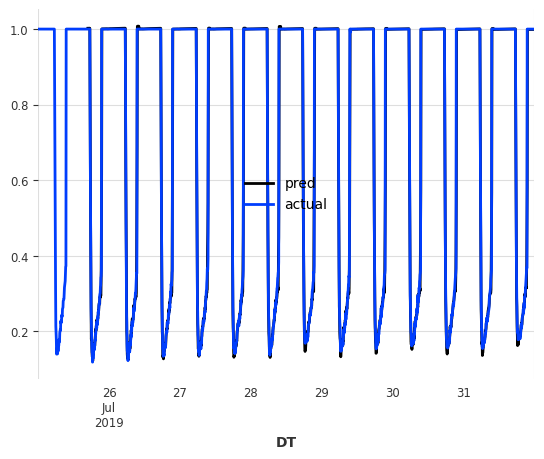

In [ ]:
backtest_1pump.plot(label='pred')
val_target.plot(label='actual')
plt.legend();
print('MAPE = {:.2f}%'.format(mean_absolute_percentage_error(val_1pumptarget_inters.values(), backtest_1pump.values())))
print('MAE = {:.2f}'.format(mae(val_1pumptarget_inters, backtest_1pump)))
print('smape = {:.2f}%'.format(smape(val_1pumptarget_inters.values(), backtest_1pump.values())))
print('R2 = {:.2f}%'.format(r2_score(val_1pumptarget_inters.values(), backtest_1pump.values())))


<Axes: xlabel='DT'>

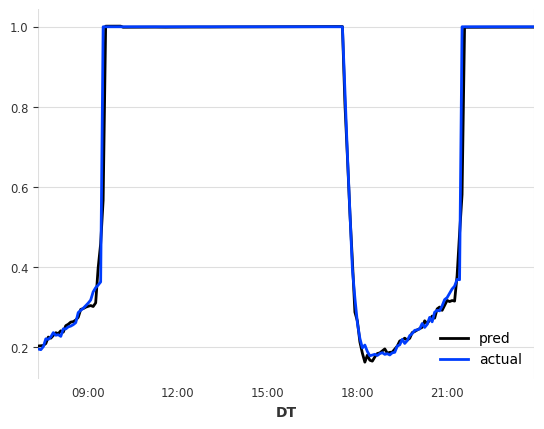

In [ ]:
backtest_1pump[-200:].plot(label='pred')
val_target[-200:].plot(label='actual')

## сделаем теперь обучение на множестве временных рядов

In [ ]:
all_pumps_df = split_df_by_pumps(training_oh, ohe_df)

In [ ]:
all_pumps_df[0].head()

,DT,T1138P6000096,T1138P6000315,DMIDT1138P4000064,DSHORTT1138P4000064,DLONGT1138P4000064,DMIDT1138P2600012,DSHORTT1138P2600012,DLONGT1138P2600012,DMIDT1205P2300000,...,226002307,226002416,226002603,226002627,226002861,226002998,226003074,226003080,226003316,226003330
87547,2019-07-31 23:55:00,0,54000,-9.030101,0.0,-8.954008,-1.470926,0.0,-1.447066,0.03392,...,1,0,0,0,0,0,0,0,0,0
87548,2019-07-31 23:50:00,0,53700,-9.030101,0.0,-8.954008,-1.470926,0.0,-1.447066,0.03392,...,1,0,0,0,0,0,0,0,0,0
87549,2019-07-31 23:45:00,0,53400,-9.030101,0.0,-8.954008,-1.470926,0.0,-1.447066,0.03392,...,1,0,0,0,0,0,0,0,0,0
87550,2019-07-31 23:40:00,0,53100,-9.030101,0.0,-8.954008,-1.470926,0.0,-1.447066,0.03392,...,1,0,0,0,0,0,0,0,0,0
87551,2019-07-31 23:35:00,0,52800,-9.030101,0.0,-8.954008,-1.470926,0.0,-1.447066,0.03392,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
FC_START

'2019-07-25 00:00:00'

In [ ]:
def get_one_pump_train_date(inp_df):
  onehot_series_0 = TimeSeries.from_dataframe(inp_df, 'DT', fill_missing_dates=True, freq='5T')

  scaler = Scaler()
  ts = scaler.fit_transform(onehot_series_0)  # scale the whole time series not caring about train/val split...
  filler = MissingValuesFiller()
  ts = filler.transform(ts, method='linear')
  target = ts['DSHORTT1138P2300058']
  # Create training and validation sets:
  train_target, val_target = target.split_after(pd.Timestamp(FC_START))

  covariates = ts[['T1138P6000096', 'T1138P6000315', 'DMIDT1138P4000064',
        'DSHORTT1138P4000064', 'DLONGT1138P4000064', 'DMIDT1138P2600012',
        'DSHORTT1138P2600012', 'DLONGT1138P2600012', 'DMIDT1205P2300000',
        'DSHORTT1205P2300000', 'DLONGT1205P2300000', 'T1205P2300000',
        'T1138P4000064', 'T1138P2600012', 'T1138P600050', 'T1013P500399',
       'DSHORTT1138P2300058', '226000188', '226000198', '226000297',
       '226001846', '226001947', '226002142', '226002148', '226002307',
       '226002416', '226002603', '226002627', '226002861', '226002998',
       '226003074', '226003080', '226003316', '226003330']]

  train_cov, val_cov = covariates.split_after(pd.Timestamp(FC_START))
  print(len(train_cov), len(train_target), len(val_cov), len(val_target))
  return train_cov, train_target, val_cov, val_target

def get_all_pump_training_date(df_all_pumps):
  train_cov_all, train_target_all, val_cov_all, val_target_all = [], [], [], []
  for pump_df in df_all_pumps:
    iter_train, iter_target, iter_val, iter_val_target = get_one_pump_train_date(pump_df)
    train_cov_all.append(iter_train)
    train_target_all.append(iter_target)
    val_cov_all.append(iter_val)
    val_target_all.append(iter_val_target)
  return train_cov_all, train_target_all, val_cov_all, val_target_all


In [ ]:
train_cov_v3, train_target_v3, val_cov_v3, val_target_v3= get_all_pump_training_date(all_pumps_df)

7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
1165 1165 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015
7985 7985 2015 2015


<Axes: xlabel='DT'>

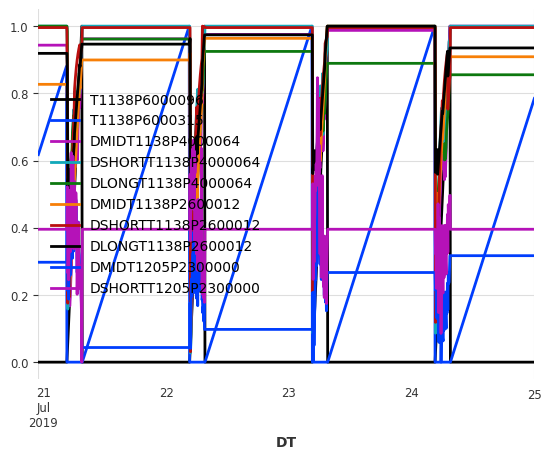

In [ ]:
train_cov_v3[2].plot()

<Axes: xlabel='DT'>

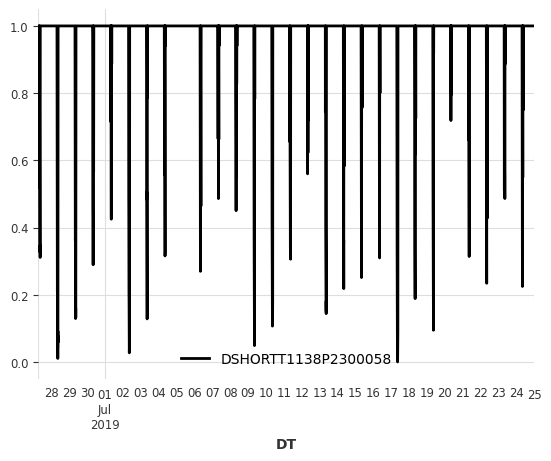

In [ ]:
train_target_v3[1].plot()

In [ ]:
model_all_pumps = TCNModel(
    input_chunk_length=144,
    output_chunk_length=1,
    n_epochs=EPOCH,
    dropout=0.01,
    dilation_base=2,
    weight_norm=True,
    kernel_size=5,
    num_filters=3,
    random_state=0
)

<Axes: xlabel='DT'>

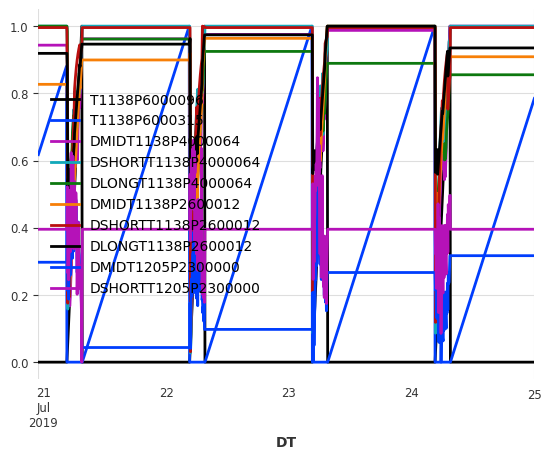

In [ ]:
train_cov_v3[2].plot()

In [ ]:
model_all_pumps.fit(series=train_target_v3,
              past_covariates=train_cov_v3,
              val_series=val_target_v3,
              val_past_covariates=val_cov_v3,
              verbose=True)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

TCNModel(output_chunk_shift=0, kernel_size=5, num_filters=3, num_layers=None, dilation_base=2, weight_norm=True, dropout=0.01, input_chunk_length=144, output_chunk_length=1, n_epochs=100, random_state=0)

In [ ]:
model_all_pumps.save('allpumps_tcn_v1.pth.tar')

In [ ]:
backtest_model_all_pumps = model_all_pumps.historical_forecasts(series=val_target_v3[0],
                                                past_covariates=val_cov_v3[0], start=0.1,
                                            retrain=False,
                                            verbose=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

In [ ]:
backtest_v3 = val_target_v3[0]
val_v3pumptarget_inters = backtest_v3.slice_intersect(backtest_model_all_pumps)


MAPE = 2.75%
MAE = 0.01
smape = 2.36%
R2 = 98.76%


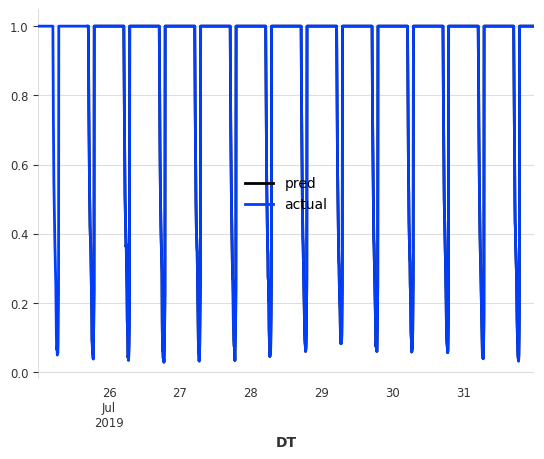

In [ ]:
val_v3pumptarget_inters.plot(label='pred')
val_target_v3[0].plot(label='actual')
plt.legend();
print('MAPE = {:.2f}%'.format(mean_absolute_percentage_error(val_v3pumptarget_inters.values(), backtest_model_all_pumps.values())*100))
print('MAE = {:.2f}'.format(mae(val_v3pumptarget_inters, backtest_model_all_pumps)))
print('smape = {:.2f}%'.format(smape(val_v3pumptarget_inters.values(), backtest_model_all_pumps.values())*100))
print('R2 = {:.2f}%'.format(r2_score(val_v3pumptarget_inters.values(), backtest_model_all_pumps.values())*100))


сделаем процедуру для запуска по всем насосам валидации

In [ ]:
get_pump_names(ohe_df)


{'226000188',
 '226000198',
 '226000297',
 '226001846',
 '226001947',
 '226002142',
 '226002148',
 '226002307',
 '226002416',
 '226002603',
 '226002627',
 '226002861',
 '226002998',
 '226003074',
 '226003080',
 '226003316',
 '226003330'}

In [ ]:
def score_model_darts(model, validation_target, validation_cov, pump_names):
    results = pd.DataFrame(columns=['mape', 'smape', 'mae', 'r2_value'])
    pump_num = 0
    true_values = []
    predict_values = []
    for key in pump_names:
        backtest_model_all_pumps_iter = model_all_pumps.historical_forecasts(
            series=validation_target[pump_num],
            past_covariates=validation_cov[pump_num],
            start=0.1,
            retrain=False,
            verbose=True)

        backtest_v3 = validation_target[pump_num]
        val_v3pumptarget_inters = backtest_v3.slice_intersect(backtest_model_all_pumps_iter)



        y_true = val_v3pumptarget_inters.values()
        y_pred = backtest_model_all_pumps_iter.values()

        true_values.append(y_true)
        predict_values.append(y_pred)


        mape = mean_absolute_percentage_error(y_true=y_true, y_pred=y_pred)
        smape_v = smape(y_true, y_pred)
        mae = mean_absolute_error(y_true=y_true, y_pred=y_pred)
        r2_value = r2_score(y_true=y_true, y_pred=y_pred)

        this_key_df = pd.DataFrame({'mape': mape, 'smape': smape_v, 'mae': mae, 'r2_value': r2_value}, index=[key])
        results = pd.concat([results, this_key_df])

        val_v3pumptarget_inters[-100:].plot(label='pred')
        backtest_model_all_pumps_iter[-100:].plot(label='actual')
        plt.show()
        val_v3pumptarget_inters[:1000].plot(label='pred_first1k')
        backtest_model_all_pumps_iter[:1000].plot(label='actual_first1k')
        plt.show()
        pump_num += 1

    true_values = np.concatenate(true_values)
    predict_values = np.concatenate(predict_values)
    return results, true_values, predict_values


Predicting: |          | 0/? [00:00<?, ?it/s]

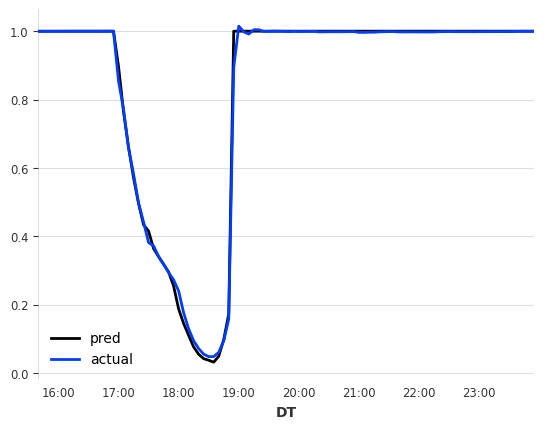

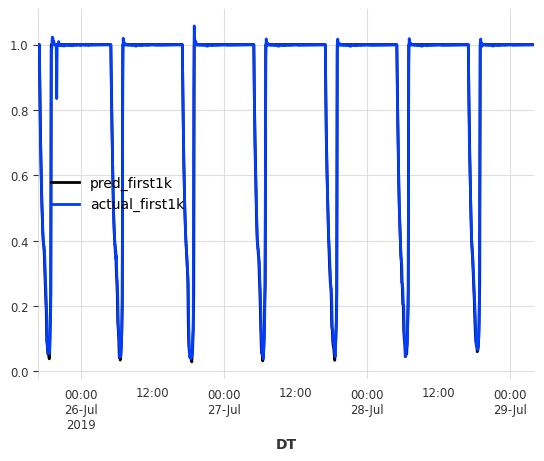

Predicting: |          | 0/? [00:00<?, ?it/s]

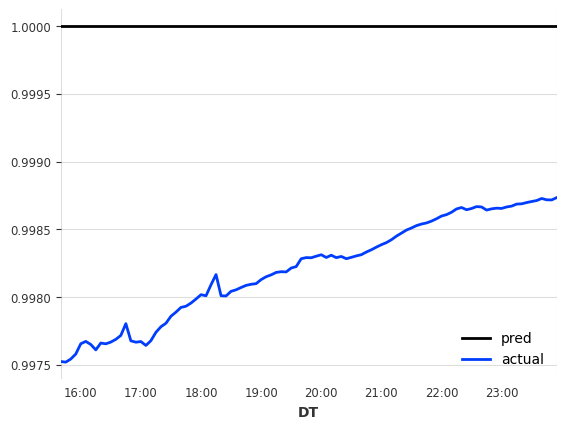

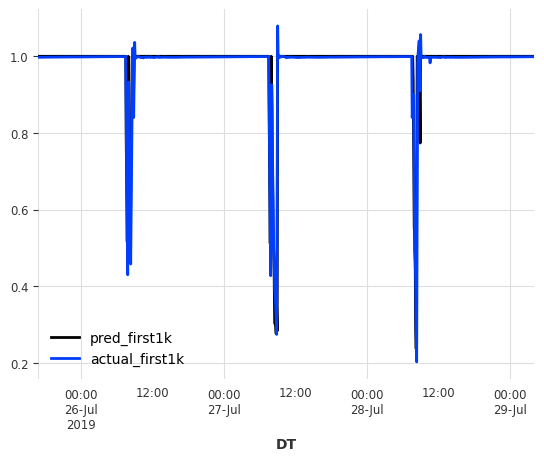

Predicting: |          | 0/? [00:00<?, ?it/s]

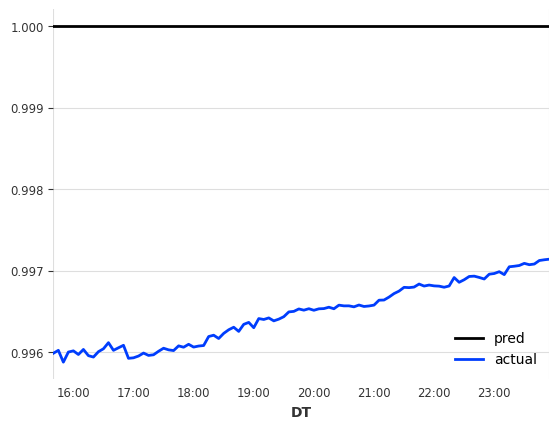

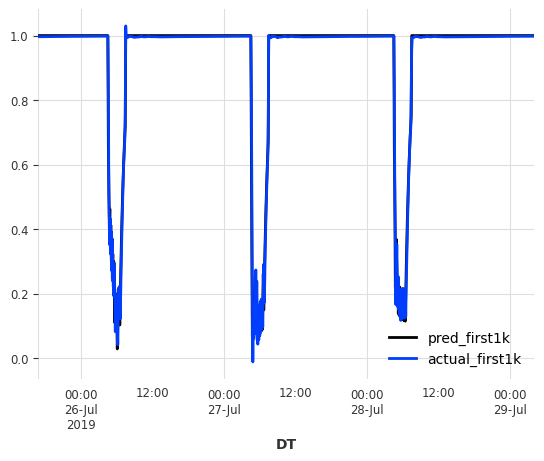

Predicting: |          | 0/? [00:00<?, ?it/s]

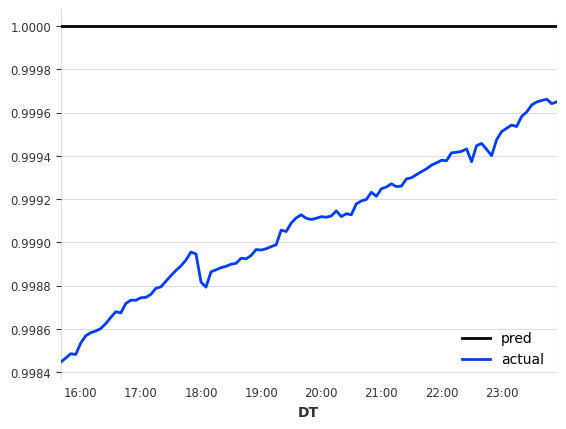

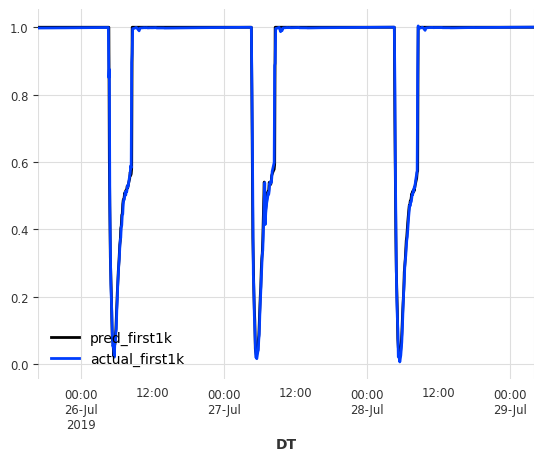

Predicting: |          | 0/? [00:00<?, ?it/s]

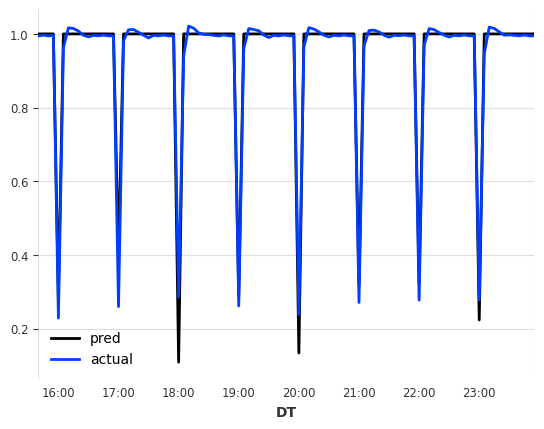

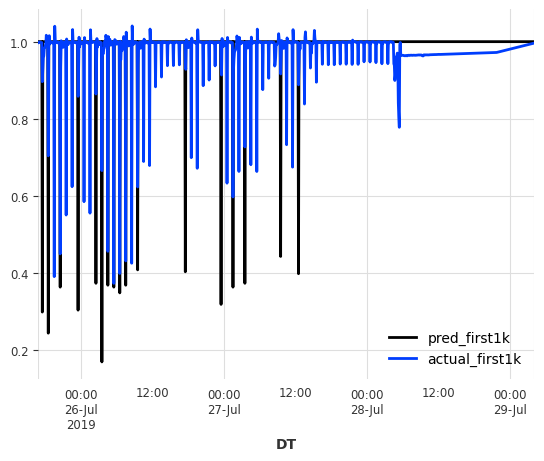

Predicting: |          | 0/? [00:00<?, ?it/s]

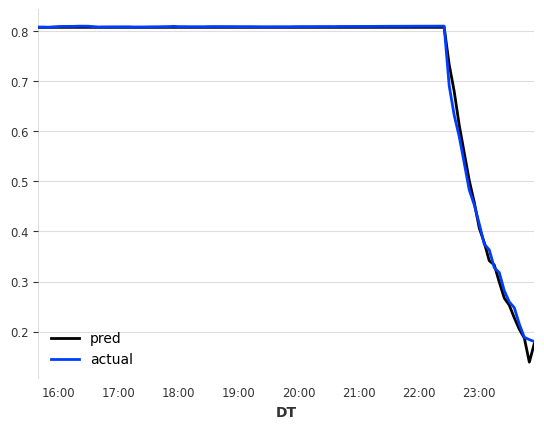

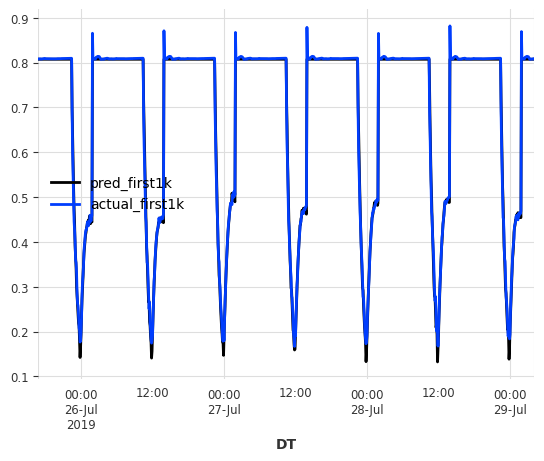

Predicting: |          | 0/? [00:00<?, ?it/s]

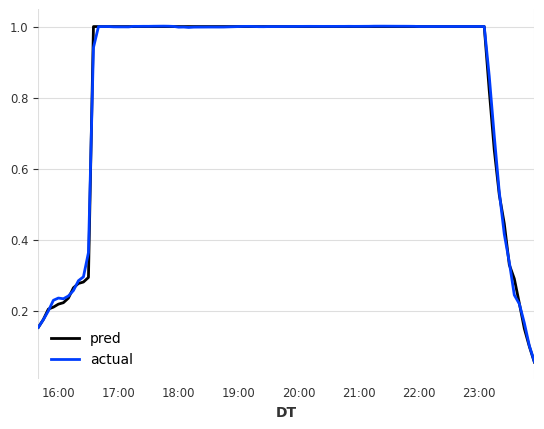

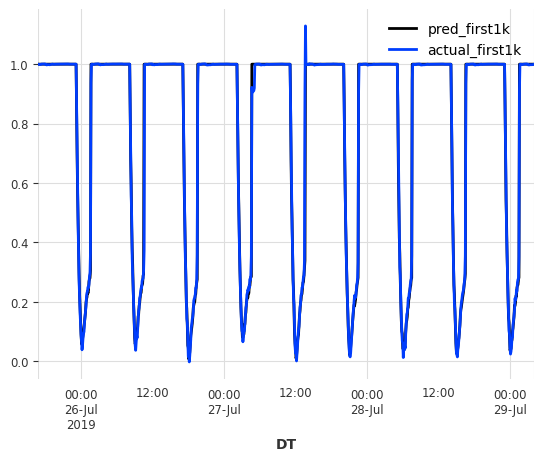

Predicting: |          | 0/? [00:00<?, ?it/s]

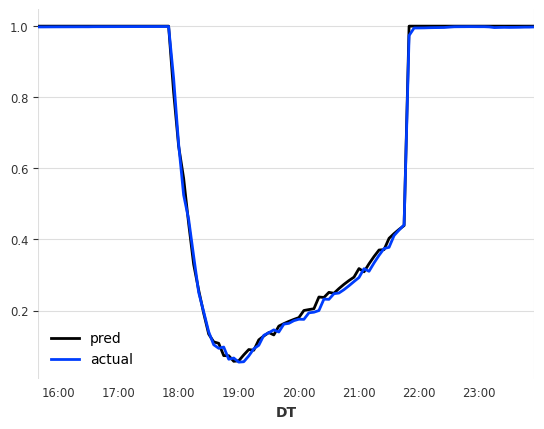

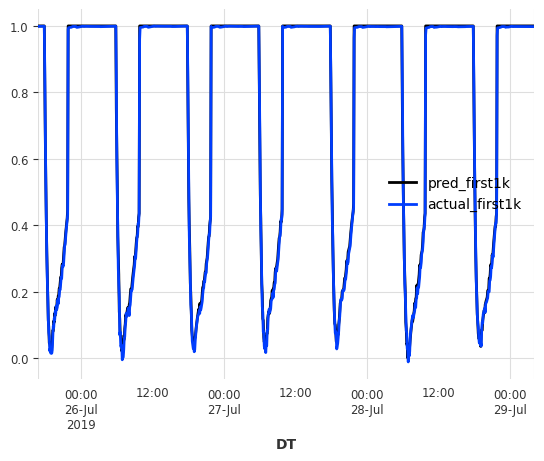

Predicting: |          | 0/? [00:00<?, ?it/s]

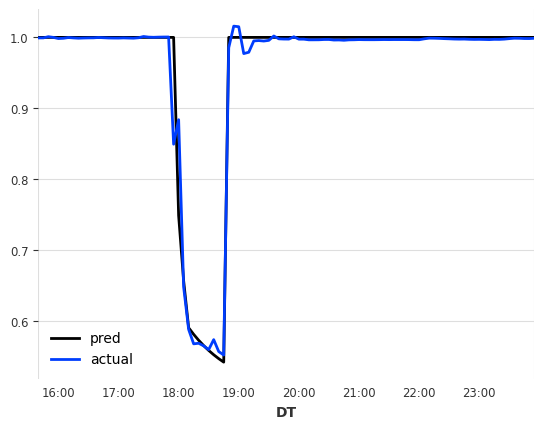

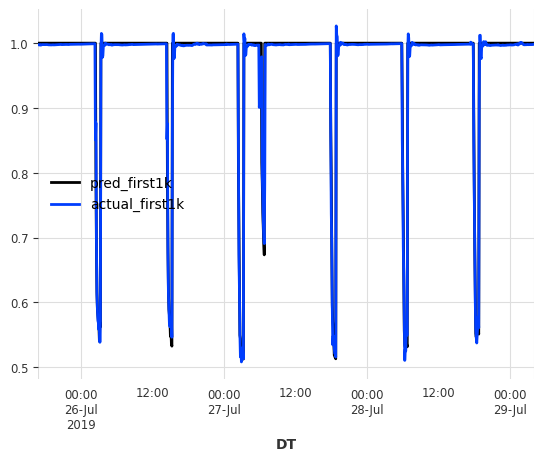

Predicting: |          | 0/? [00:00<?, ?it/s]

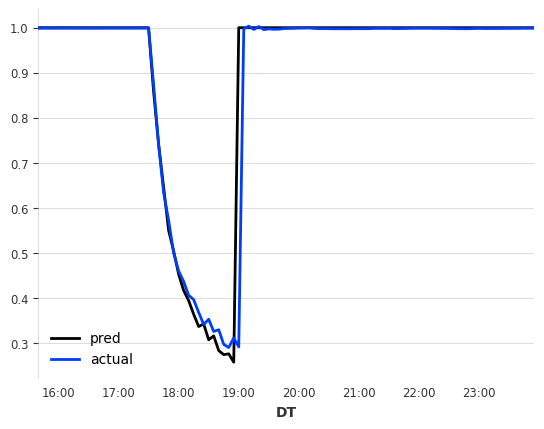

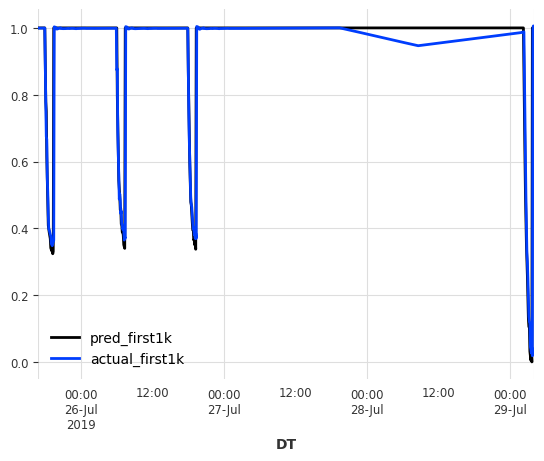

Predicting: |          | 0/? [00:00<?, ?it/s]

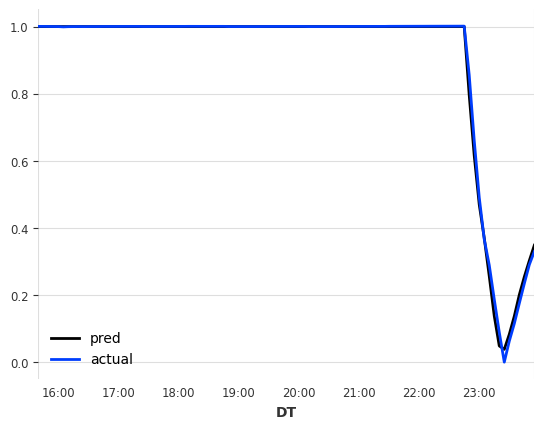

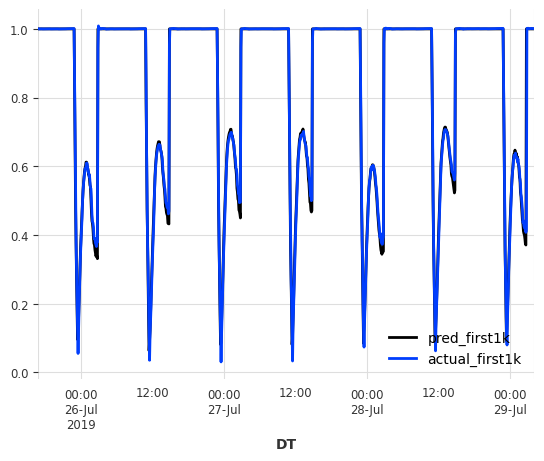

Predicting: |          | 0/? [00:00<?, ?it/s]

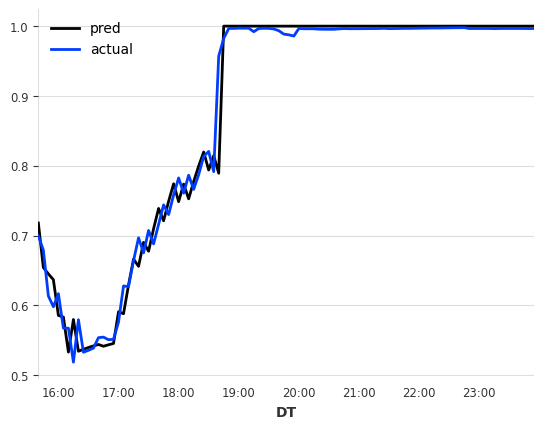

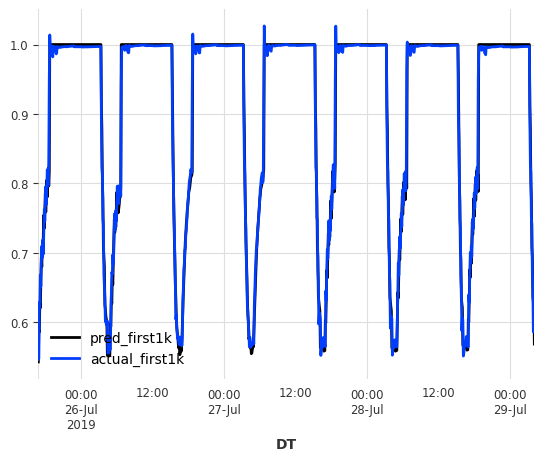

Predicting: |          | 0/? [00:00<?, ?it/s]

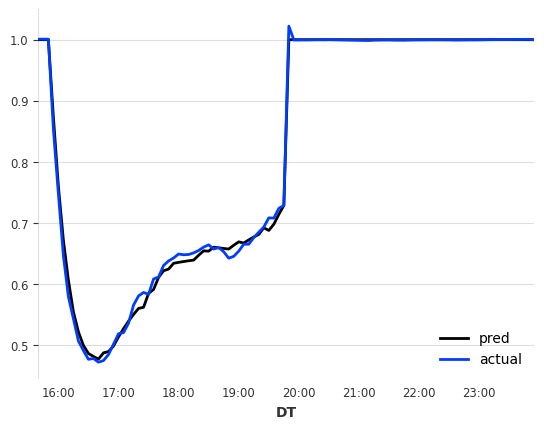

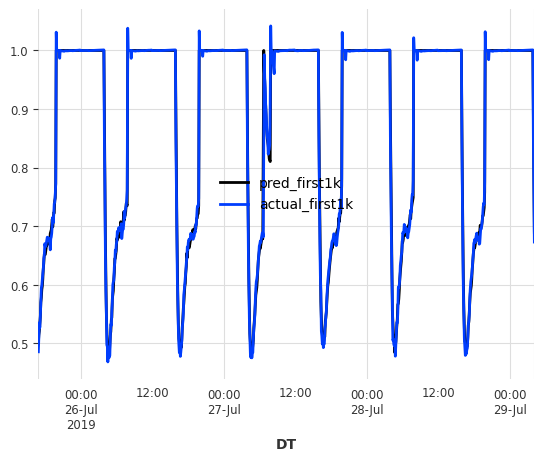

Predicting: |          | 0/? [00:00<?, ?it/s]

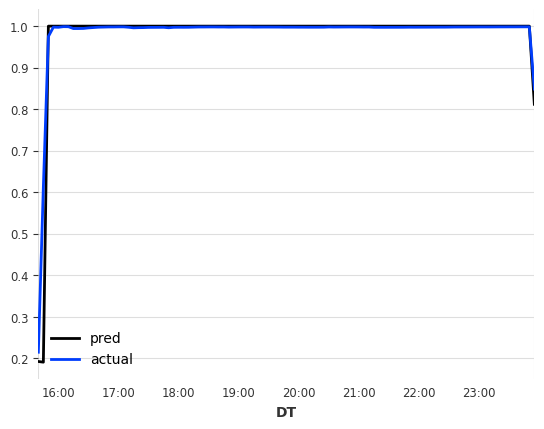

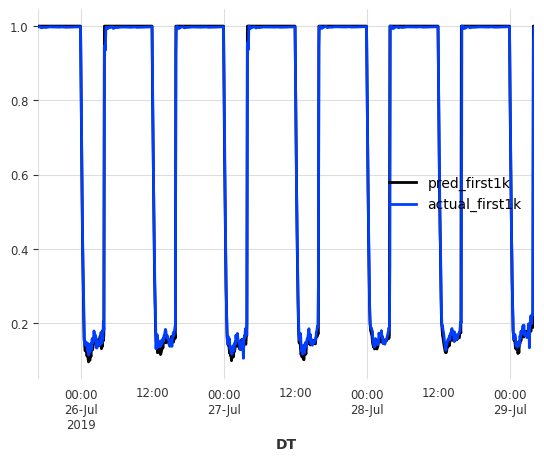

Predicting: |          | 0/? [00:00<?, ?it/s]

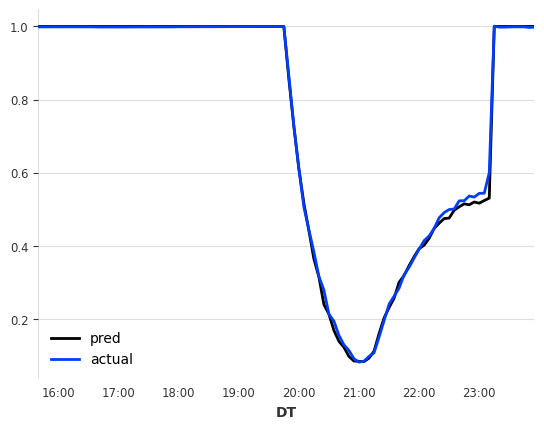

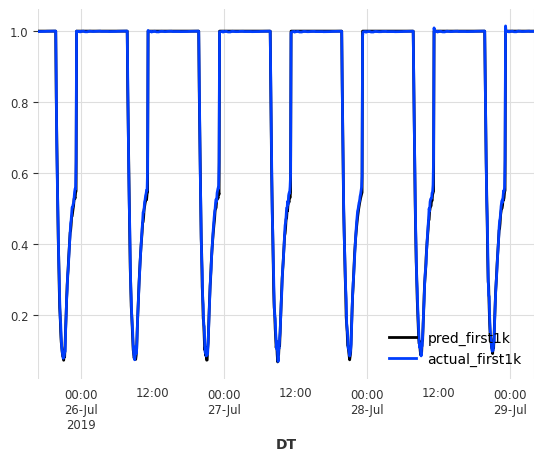

Predicting: |          | 0/? [00:00<?, ?it/s]

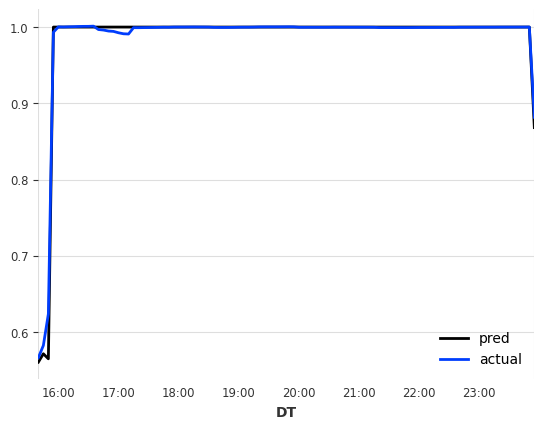

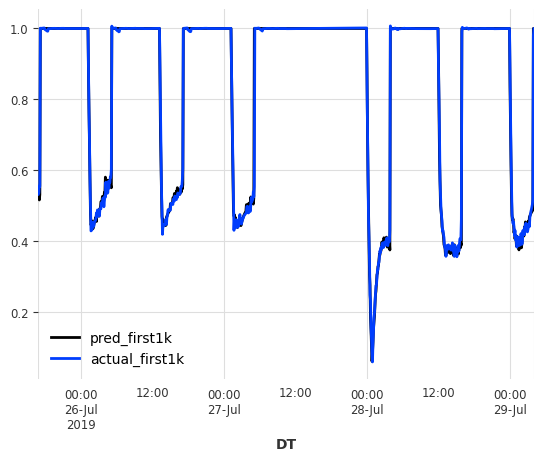

Predicting: |          | 0/? [00:00<?, ?it/s]

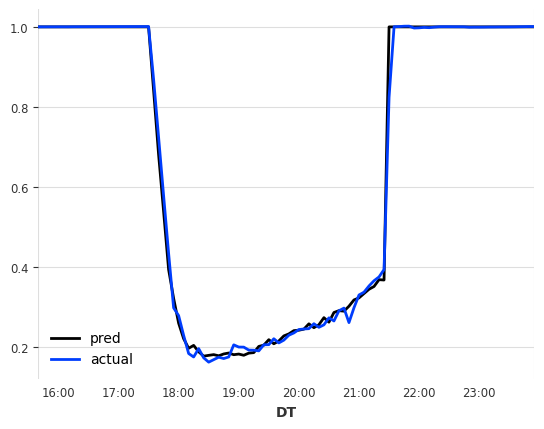

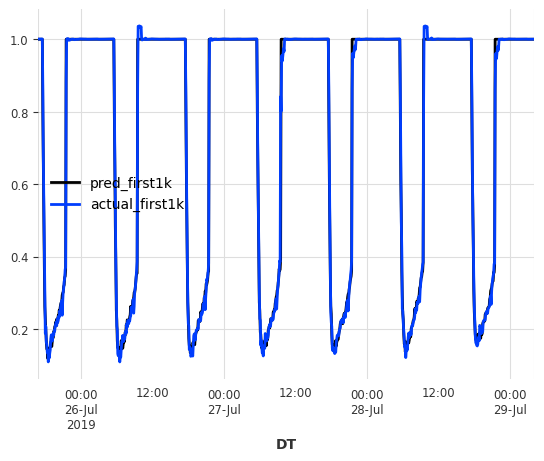

,mape,smape,mae,r2_value
226002627,2.745011e-02,0.023624,0.006534,0.987590
226002307,1.392603e-02,0.012940,0.007552,0.908762
226002148,1.731099e+11,0.046770,0.011823,0.981895
226002861,1.754086e-02,0.018726,0.005036,0.992823
226002603,6.593880e+11,0.039988,0.023818,0.779666
226000198,1.343395e-02,0.012893,0.005166,0.997028
226002142,3.361622e-02,0.034245,0.006041,0.995110
226001846,6.471668e+10,0.042244,0.006547,0.999043
226001947,5.888989e-03,0.005909,0.005100,0.972633
226002998,1.049967e+11,0.023698,0.013428,0.913494


In [ ]:
results_for_17_test, true_17_test, predict_17 = score_model_darts(model=model_all_pumps,
                        validation_target=val_target_v3,
                        validation_cov=val_cov_v3,
                        pump_names=get_pump_names(ohe_df))
results_for_17_test

In [ ]:
results_for_17_test.to_csv('test_results.csv')

In [ ]:
results_for_17_test.mean()

,0
mape,5.895361e+10
smape,2.266322e-02
mae,8.084683e-03
r2_value,9.696334e-01


loading validation dataset

In [ ]:

def get_one_pump_ext_val(inp_df):
  onehot_series_0 = TimeSeries.from_dataframe(inp_df, 'DT', fill_missing_dates=True, freq='5T')

  scaler = Scaler()
  ts = scaler.fit_transform(onehot_series_0)  # scale the whole time series not caring about train/val split...
  filler = MissingValuesFiller()
  ts = filler.transform(ts, method='linear')
  target = ts['DSHORTT1138P2300058']
  # Create training and validation sets:

  covariates = ts[['T1138P6000096', 'T1138P6000315', 'DMIDT1138P4000064',
        'DSHORTT1138P4000064', 'DLONGT1138P4000064', 'DMIDT1138P2600012',
        'DSHORTT1138P2600012', 'DLONGT1138P2600012', 'DMIDT1205P2300000',
        'DSHORTT1205P2300000', 'DLONGT1205P2300000', 'T1205P2300000',
        'T1138P4000064', 'T1138P2600012', 'T1138P600050', 'T1013P500399',
       'DSHORTT1138P2300058', '226000188', '226000198', '226000297',
       '226001846', '226001947', '226002142', '226002148', '226002307',
       '226002416', '226002603', '226002627', '226002861', '226002998',
       '226003074', '226003080', '226003316', '226003330']]

  print(len(covariates), len(target))
  return covariates, target

def get_all_pump_ext_val(df_all_pumps):
  val_cov_all, val_target_all = [], []
  for pump_df in df_all_pumps:
    iter_val, iter_val_target = get_one_pump_ext_val(pump_df)
    val_cov_all.append(iter_val)
    val_target_all.append(iter_val_target)
  return val_cov_all, val_target_all


def read_valid(link, encoder):

    data = pd.read_csv(link, index_col=False)
    data.drop(['Unnamed: 0',
     'MIDUPT1138P2300058',
     'SHORTUPT1138P2300058',
     'LONGUPT1138P2300058',
     'DMIDT1138P2300058',
     'DLONGT1138P2300058',
     'UNIXDT', 'UUID'
     ], axis=1, inplace=True)
    data = data.fillna(0)

    transformed = encoder.transform(data.WELL_ID)
    ohe_df = pd.DataFrame(transformed)
    ohe_df.columns = encoder.classes_
    df_oh = pd.concat([data, ohe_df], axis=1).drop(['WELL_ID'], axis=1)

    pump_ids = set(data.WELL_ID.unique())


    df_list = list()

    for pump in pump_ids:
        df_list.append(df_oh[df_oh[pump] == 1])

    val_cov, val_target = get_all_pump_ext_val(df_list)

    return val_target, val_cov, pump_ids

In [ ]:
data_address

'/content/gdrive/My Drive/pump-data'

In [ ]:
valid1 = f'{data_address}/sng_dataset_v1_valid1.csv'
valid2 = f'{data_address}/sng_dataset_v1_valid2.csv'

In [ ]:
val_target1, val_cov1, val1_pumps  = read_valid(valid1, pump_encoder)
val_target2, val_cov2, val2_pumps  = read_valid(valid2, pump_encoder)

1667 1667
963 963
1667 1667
1667 1667
1667 1667
963 963
1667 1667
1667 1667
1667 1667
1667 1667
1667 1667
1263 1263
1667 1667
1667 1667
1667 1667
1667 1667
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334
1334 1334


## запустим более подробно с графиками

In [ ]:
def validate_model(model, validation_target, validation_cov):
    results = pd.DataFrame(columns=['mape', 'smape', 'mae', 'r2_value'])
    true_values = []
    predict_values = []
    for part in range(len(validation_target)):
        print(len(validation_target[part]), len(validation_cov[part]))
        backtest_model_all_pumps_iter = model.historical_forecasts(
            series=validation_target[part],
            past_covariates=validation_cov[part],
            start=0.4,
            retrain=False,
            verbose=True)

        backtest_v3 = validation_target[part]
        val_v3pumptarget_inters = backtest_v3.slice_intersect(backtest_model_all_pumps_iter)



        y_true = val_v3pumptarget_inters.values()
        y_pred = backtest_model_all_pumps_iter.values()

        true_values.append(y_true)
        predict_values.append(y_pred)


        mape = mean_absolute_percentage_error(y_true=y_true, y_pred=y_pred)
        smape_v = smape(y_true, y_pred)
        mae = mean_absolute_error(y_true=y_true, y_pred=y_pred)
        r2_value = r2_score(y_true=y_true, y_pred=y_pred)

        this_key_df = pd.DataFrame({'mape': mape, 'smape': smape_v, 'mae': mae, 'r2_value': r2_value}, index=[part])
        results = pd.concat([results, this_key_df])

        val_v3pumptarget_inters[-100:].plot(label='pred')
        backtest_model_all_pumps_iter[-100:].plot(label='actual')
        plt.show()
        val_v3pumptarget_inters[:1000].plot(label='pred_first1k')
        backtest_model_all_pumps_iter[:1000].plot(label='actual_first1k')
        plt.show()

    true_values = np.concatenate(true_values)
    predict_values = np.concatenate(predict_values)
    return results, true_values, predict_values


In [ ]:
from darts.models import TCNModel

model_all_pumps = TCNModel.load("allpumps_tcn_v1.pth.tar")

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

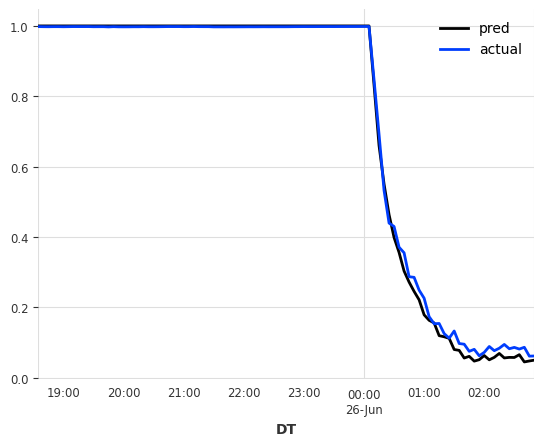

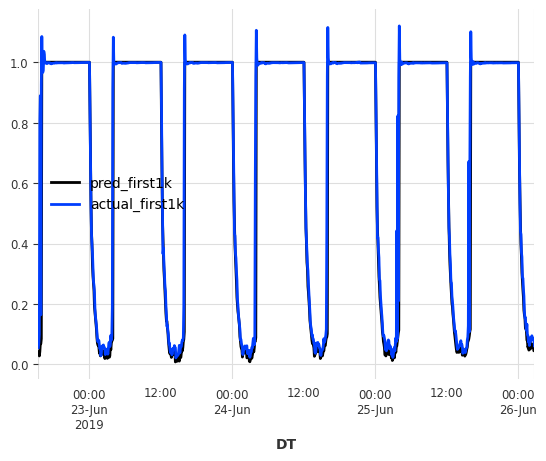

963 963


Predicting: |          | 0/? [00:00<?, ?it/s]

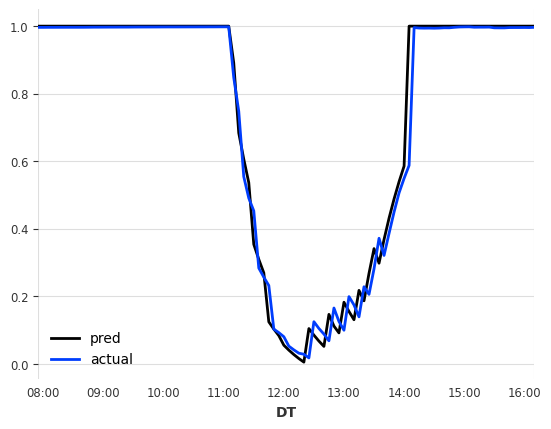

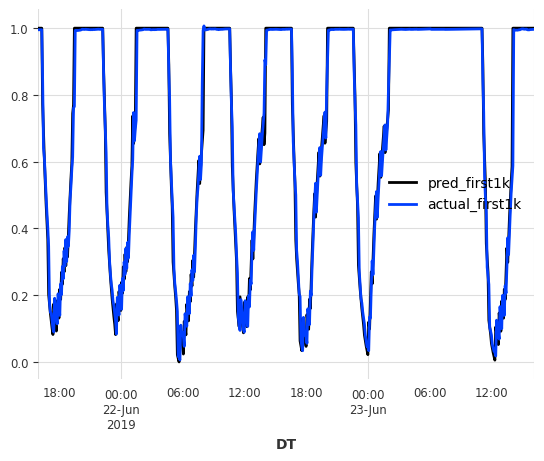

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

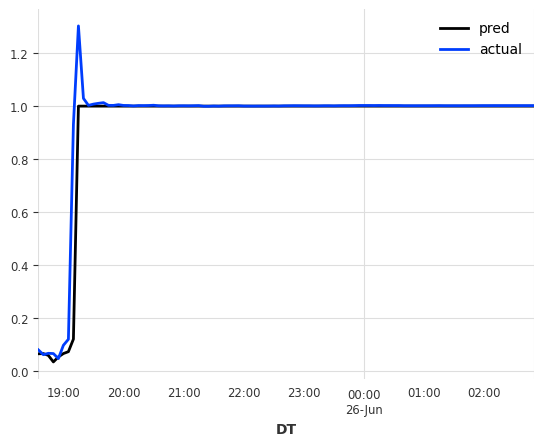

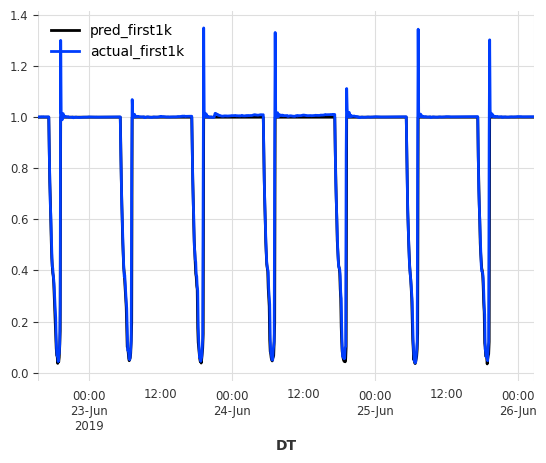

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

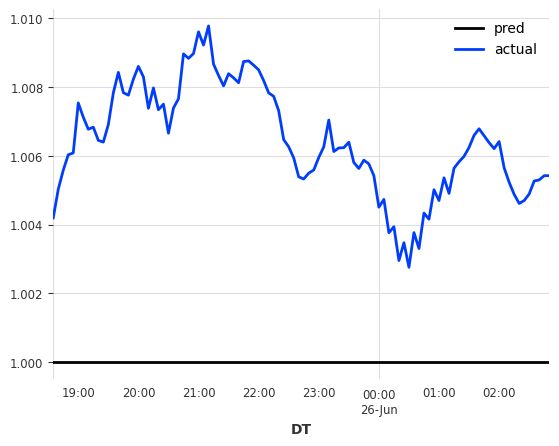

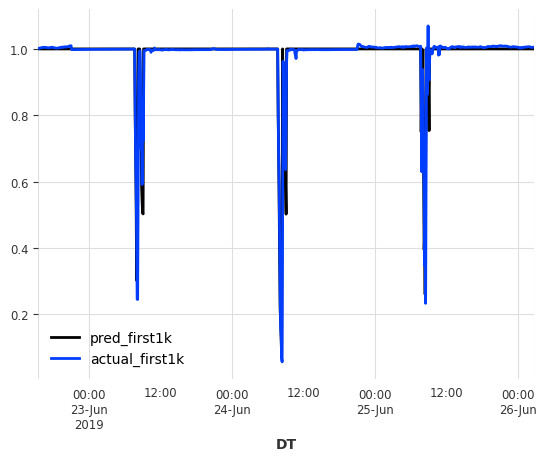

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

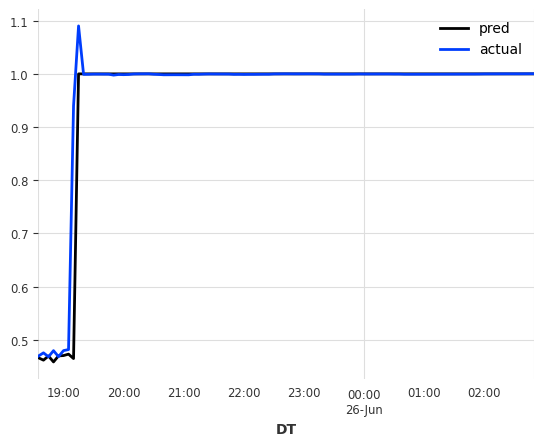

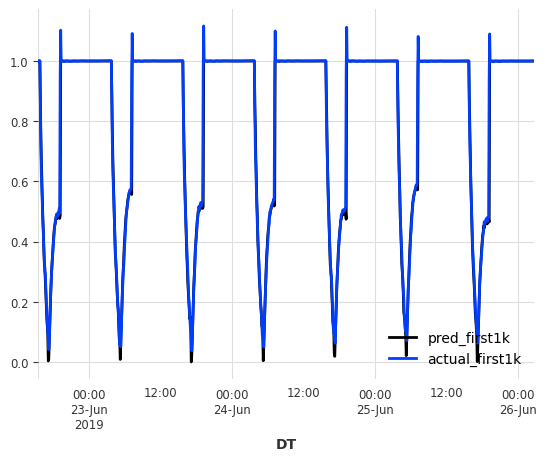

963 963


Predicting: |          | 0/? [00:00<?, ?it/s]

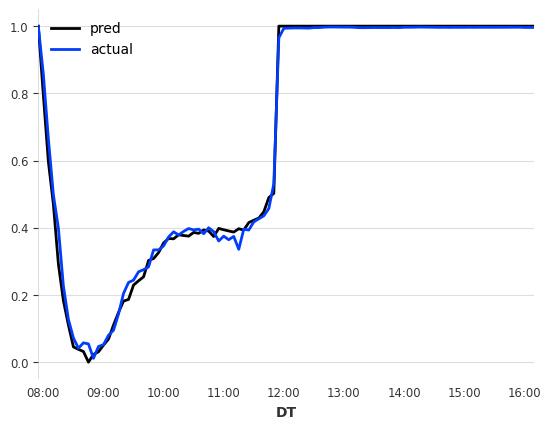

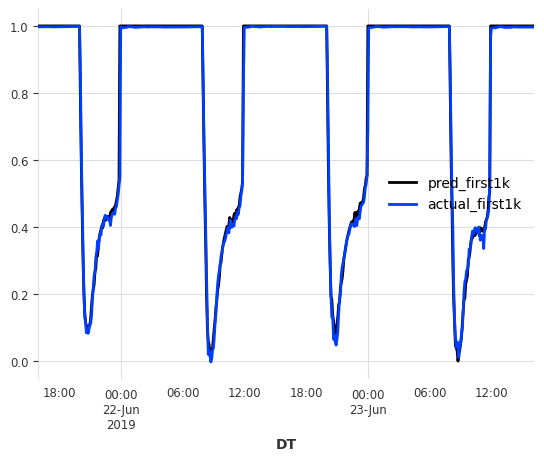

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

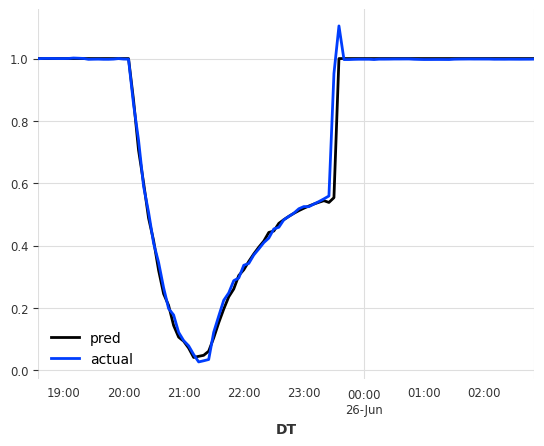

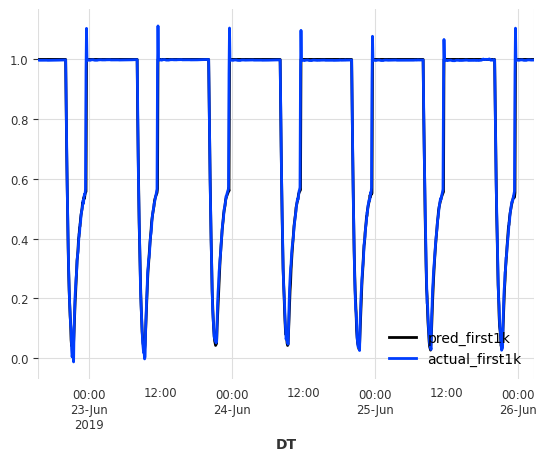

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

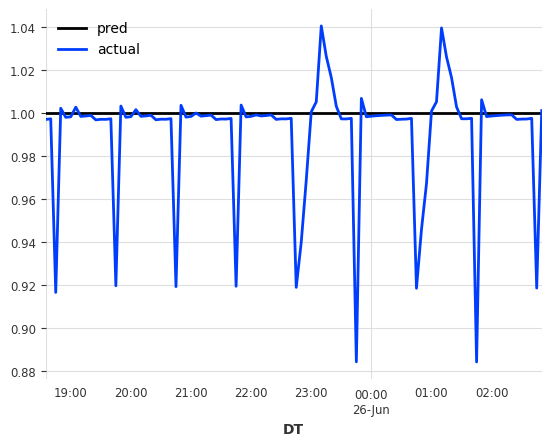

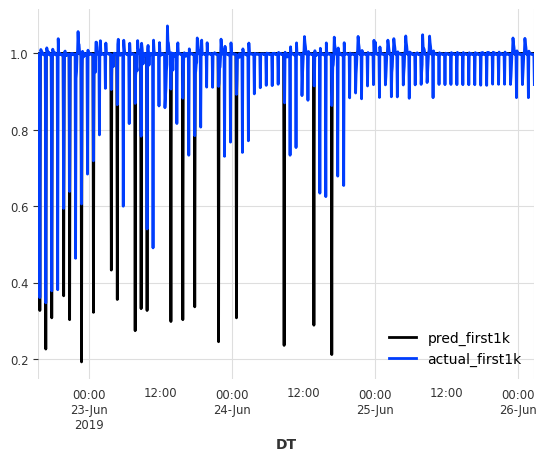

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

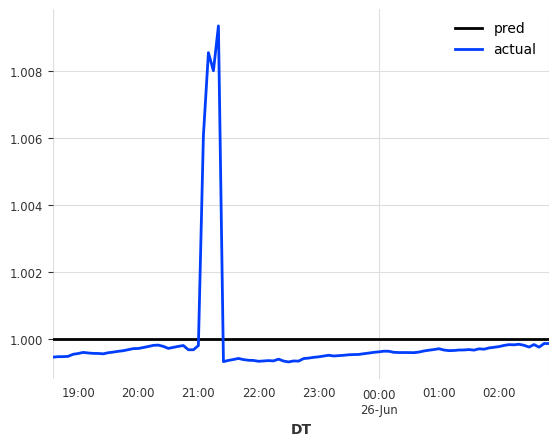

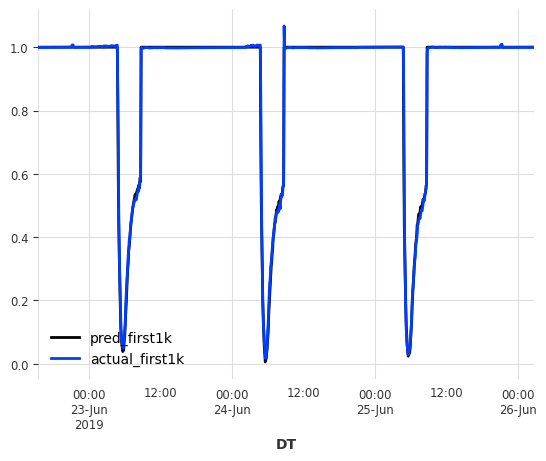

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

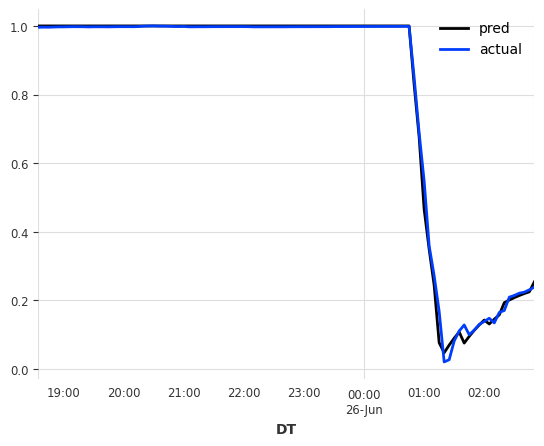

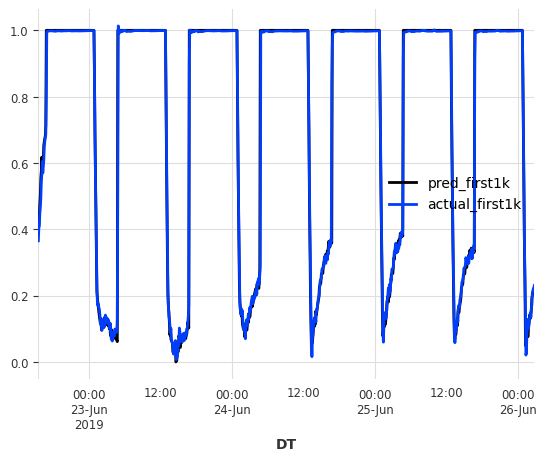

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

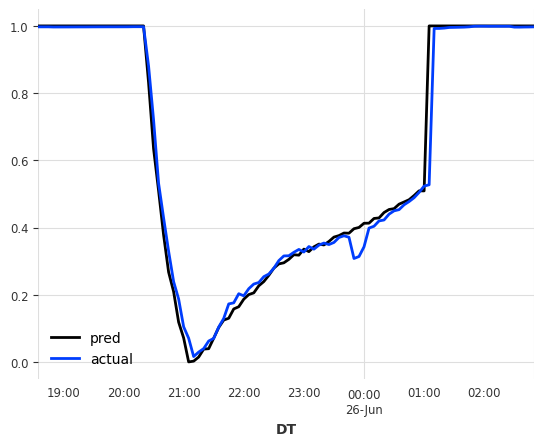

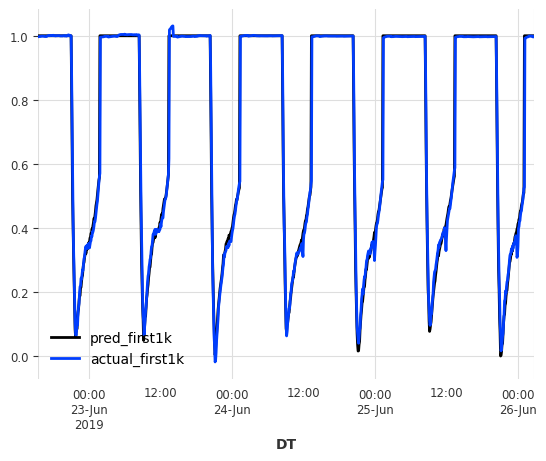

1263 1263


Predicting: |          | 0/? [00:00<?, ?it/s]

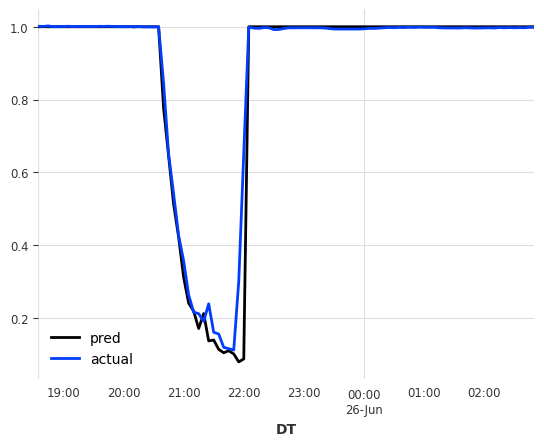

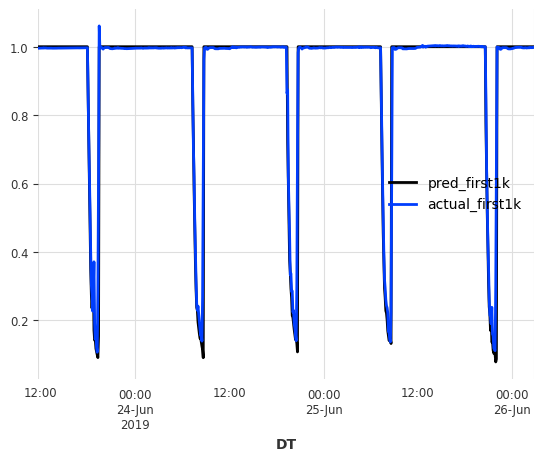

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

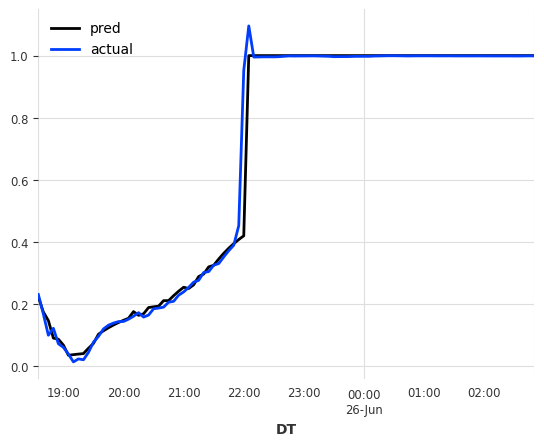

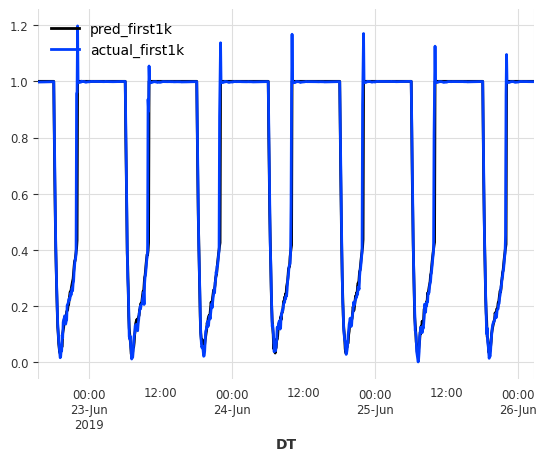

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

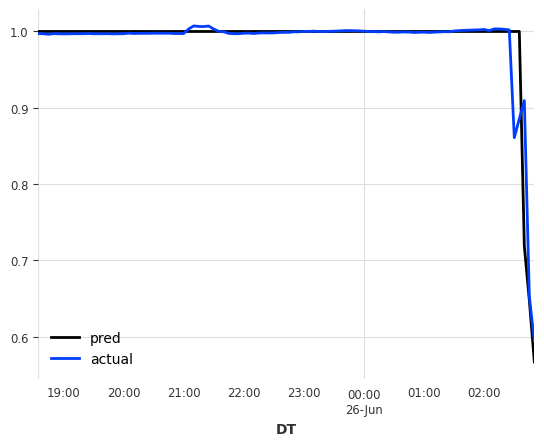

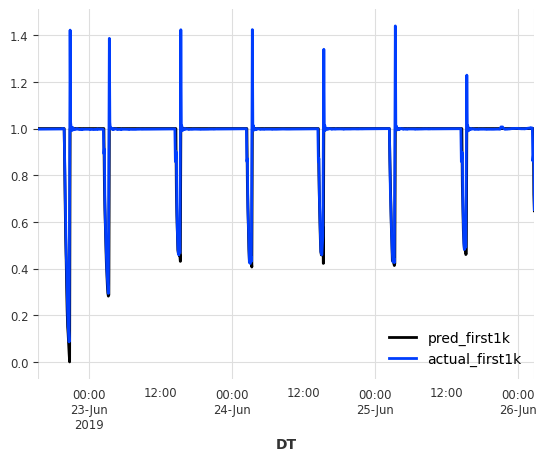

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

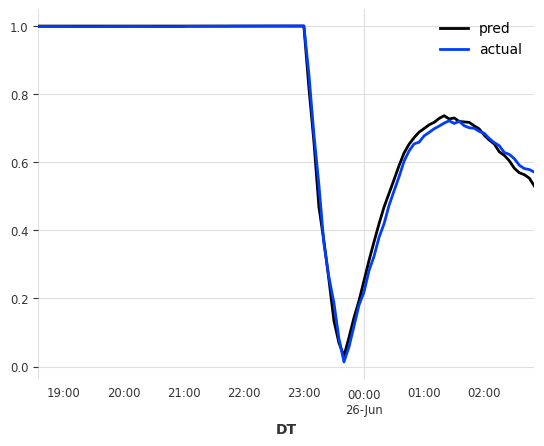

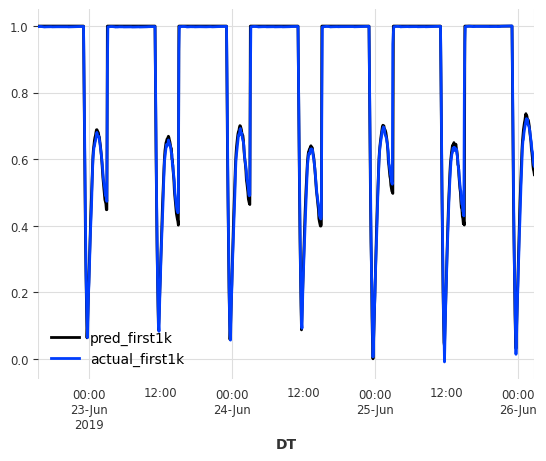

1667 1667


Predicting: |          | 0/? [00:00<?, ?it/s]

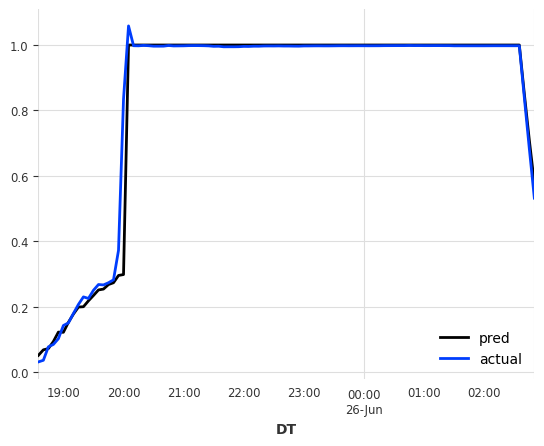

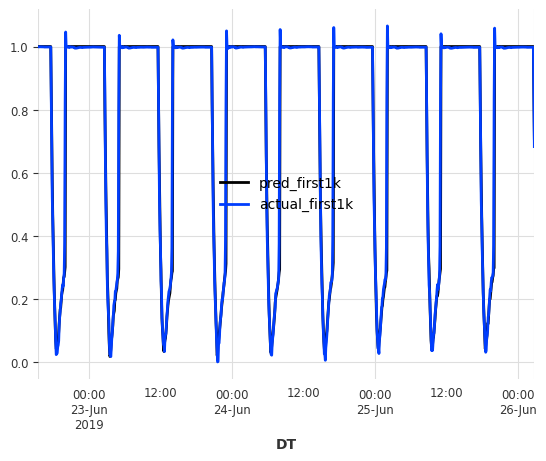

In [ ]:
results_for_valid1, true_valid1, predict__valid1 = validate_model(model=model_all_pumps,
                        validation_target=val_target1,
                        validation_cov=val_cov1)

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

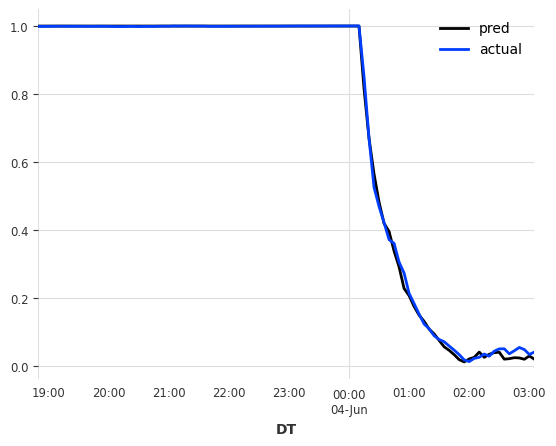

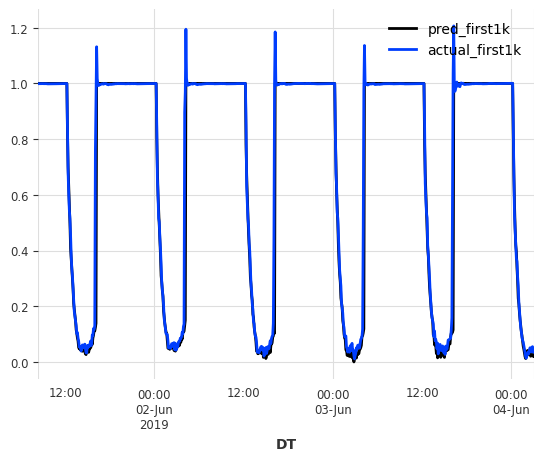

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

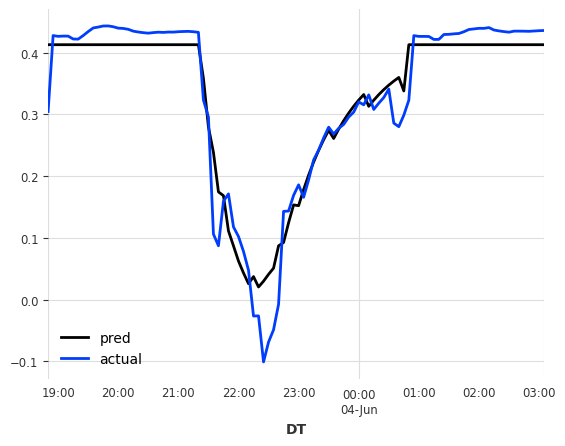

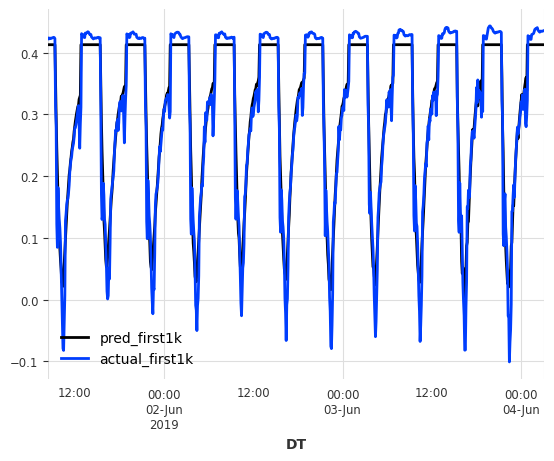

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

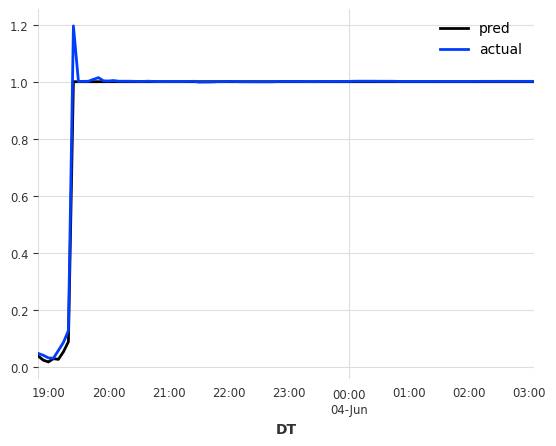

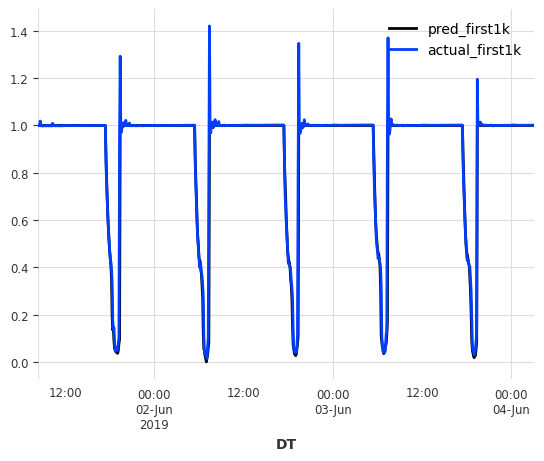

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

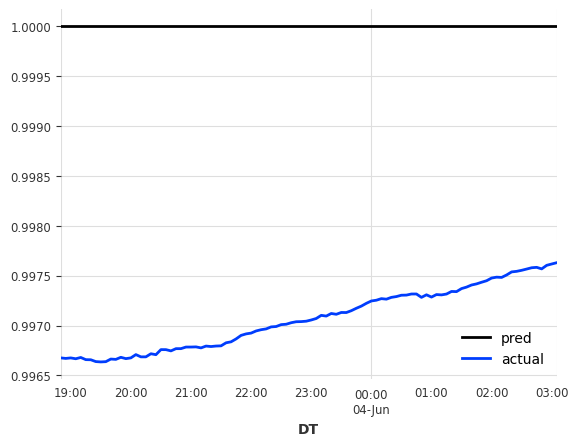

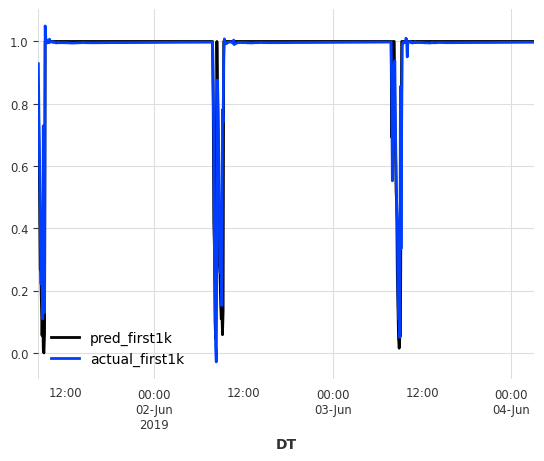

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

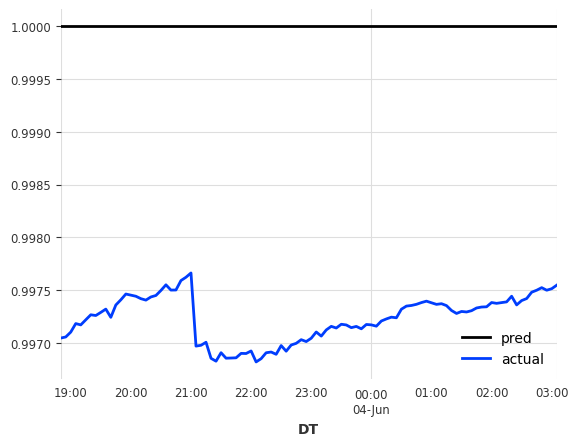

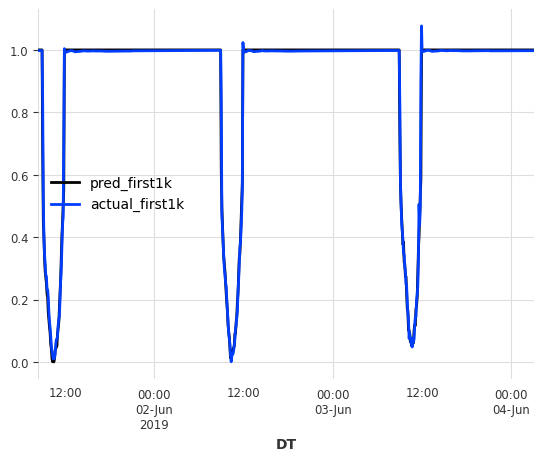

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

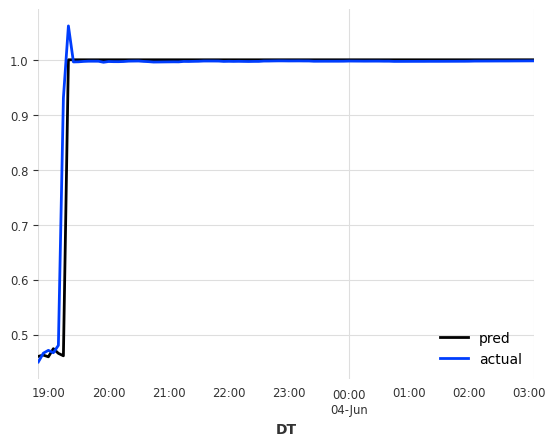

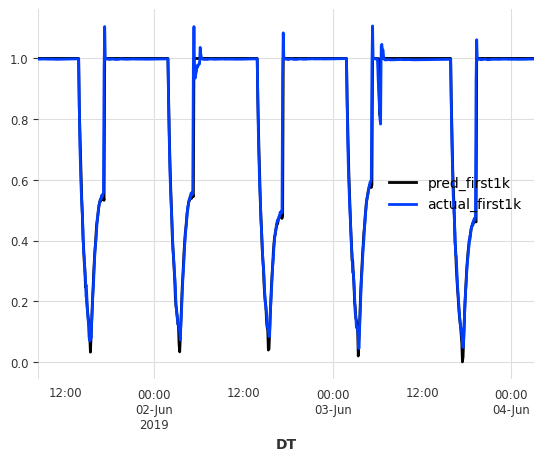

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

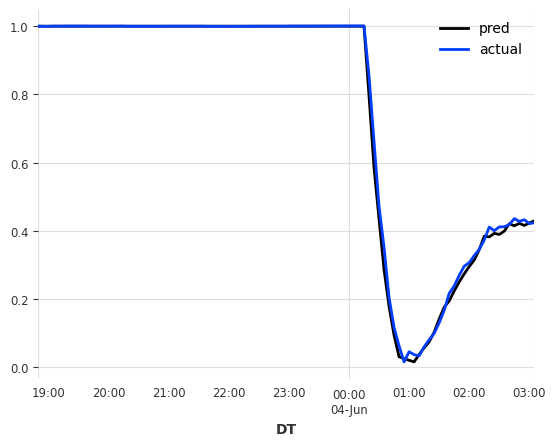

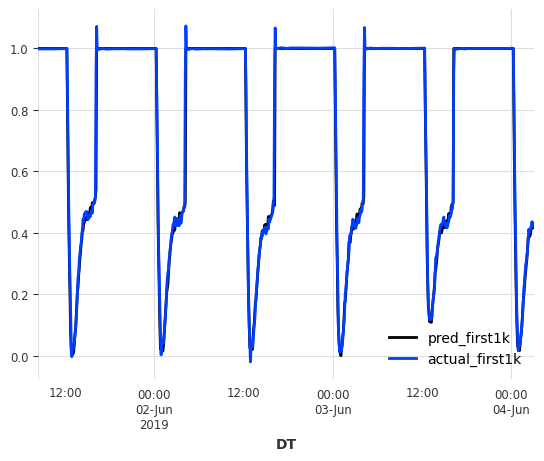

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

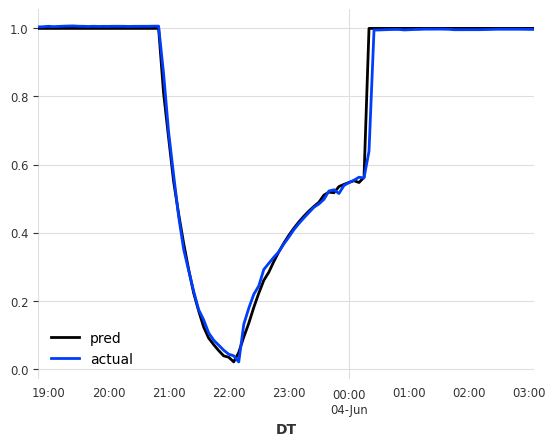

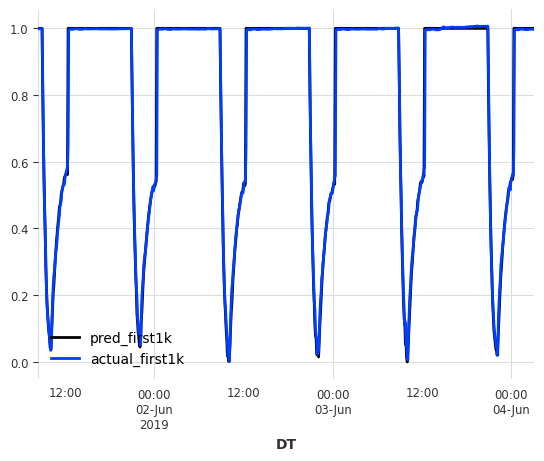

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

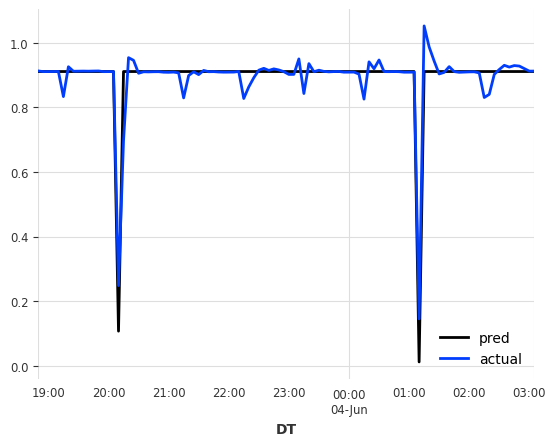

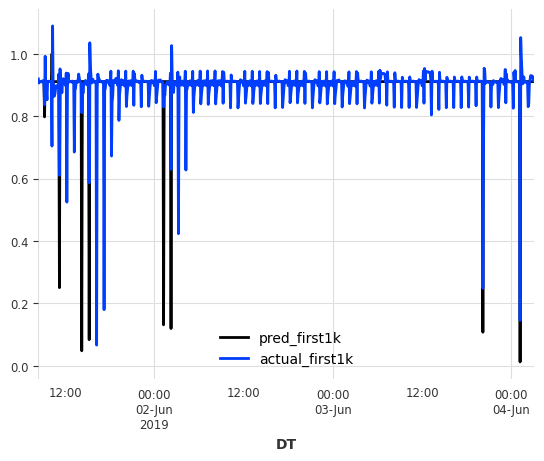

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

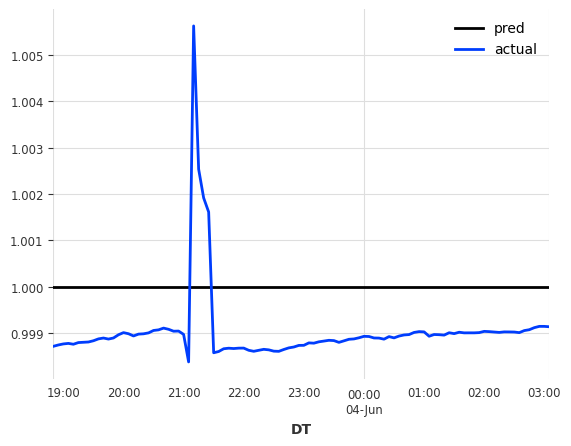

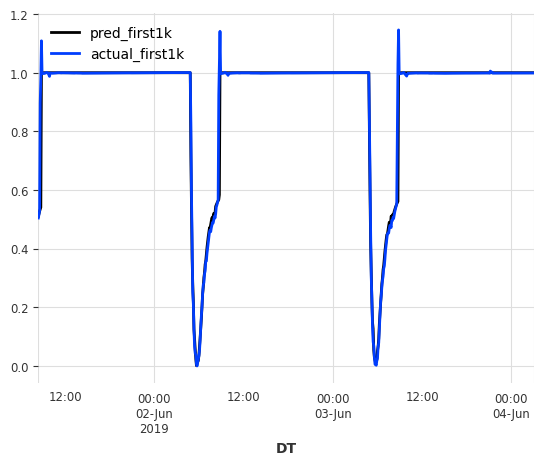

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

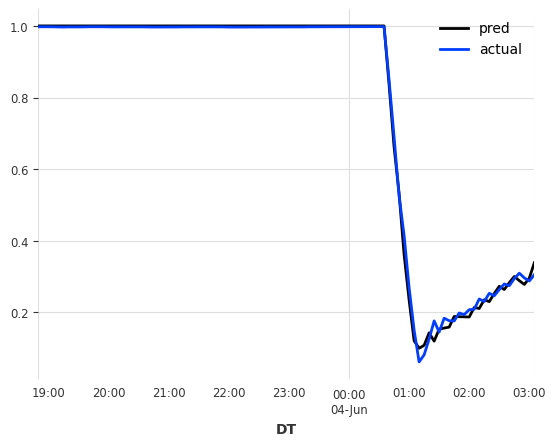

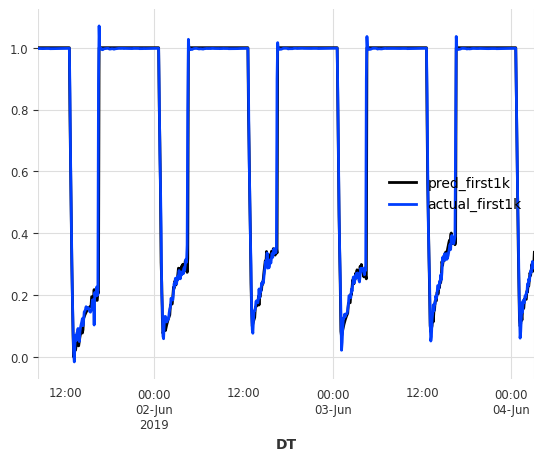

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

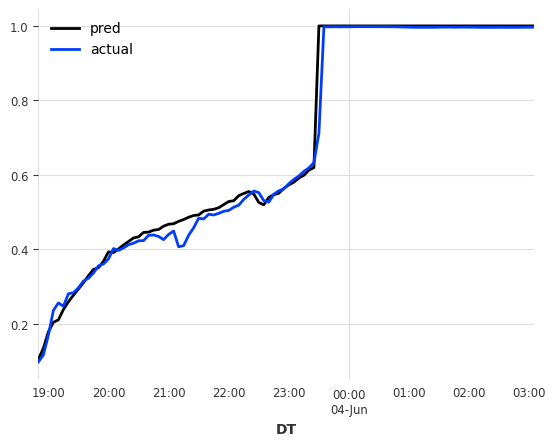

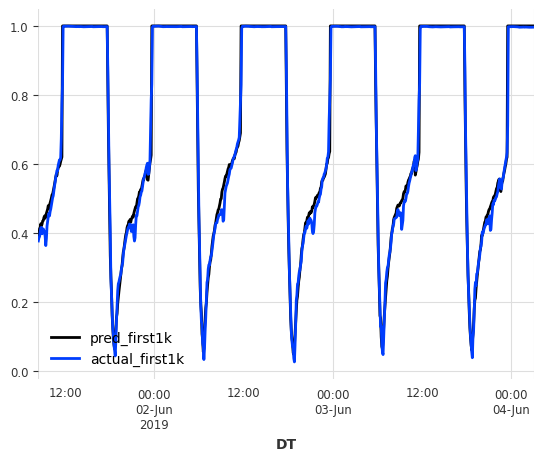

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

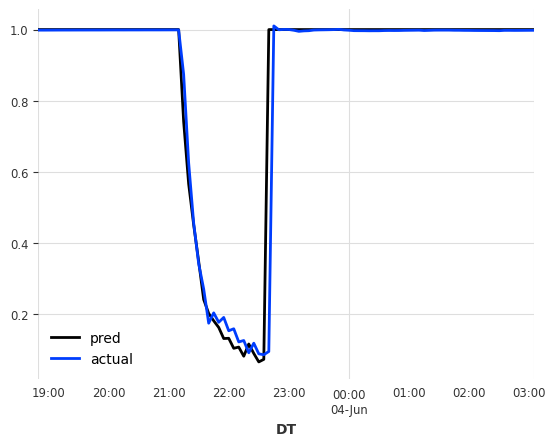

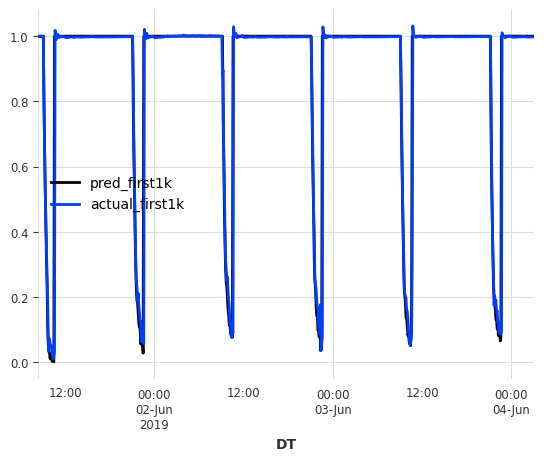

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

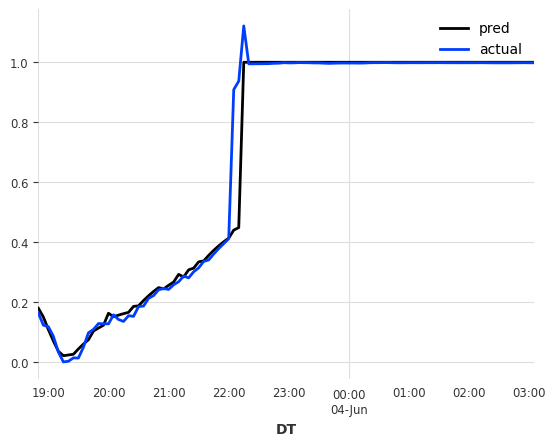

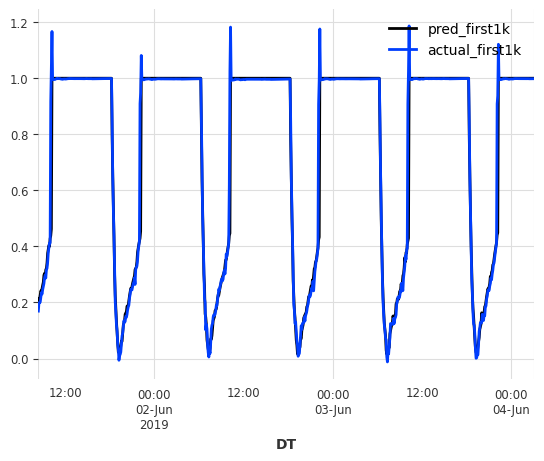

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

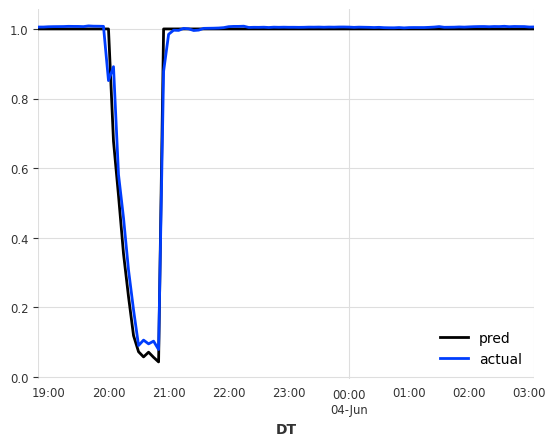

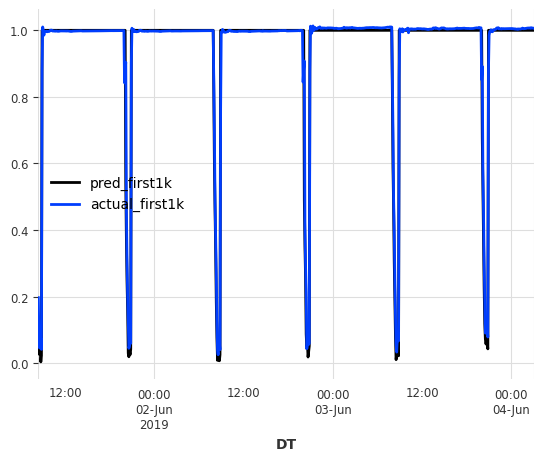

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

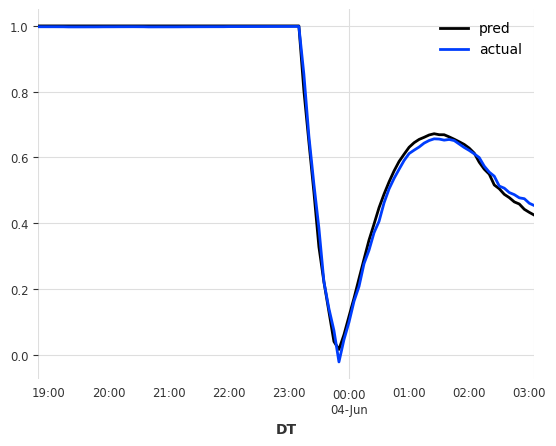

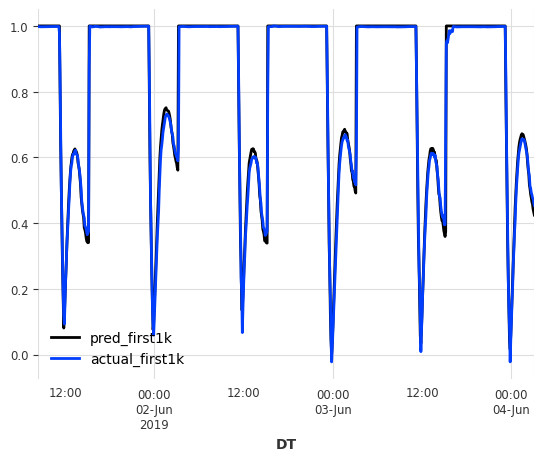

1334 1334


Predicting: |          | 0/? [00:00<?, ?it/s]

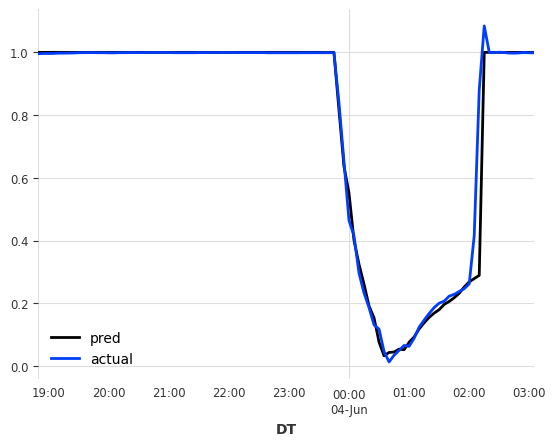

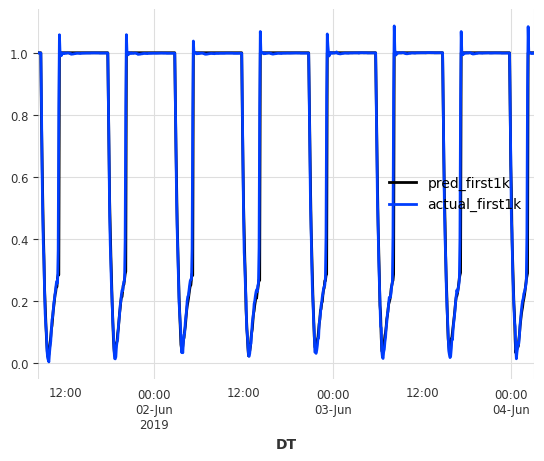

In [ ]:
results_for_valid2, true_valid2, predict__valid2 = validate_model(model=model_all_pumps,
                        validation_target=val_target2,
                        validation_cov=val_cov2)

In [ ]:
results_for_valid1.to_csv('tcn_valid_results.csv')

In [ ]:
results_for_valid2.to_csv('tcn_valid_results.csv')

In [ ]:
results_for_valid1.mean()

,0
mape,3.311366e+11
smape,4.339523e-02
mae,1.257561e-02
r2_value,9.101903e-01


In [ ]:
results_for_valid2.mean()

,0
mape,1.677197e+11
smape,5.396409e-02
mae,1.266086e-02
r2_value,9.079419e-01


# transformers

In [ ]:
from darts.models import TransformerModel


In [ ]:
trans_model = TransformerModel(
    input_chunk_length = 144,
    output_chunk_length = 1,
    batch_size = 32,
    n_epochs = EPOCH,
    model_name = 'all_pumps_transformer',
    log_tensorboard=True,
    nr_epochs_val_period = 10,
    d_model = 32,
    nhead = 16,
    num_encoder_layers = 3,
    num_decoder_layers = 3,
    dim_feedforward = 512,
    dropout = 0.1,
    activation = "relu",
    random_state=0
)

In [ ]:
trans_model.fit(series=train_target_v3,
              past_covariates=train_cov_v3,
              val_series=val_target_v3,
              val_past_covariates=val_cov_v3,
              verbose=True)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

NameError: name 'exit' is not defined

In [ ]:
trans_model.save_model('allpumps_transformer.pth.tar')

In [ ]:
from darts.models import TransformerModel

trans_model = TransformerModel.load("allpumps_transformer.pth.tar")

In [ ]:
results_for_valid1trans, true_valid1trans, predict__valid1trans = validate_model(model=trans_model,
                        validation_target=val_target1,
                        validation_cov=val_cov1)

1667 1667


AttributeError: 'TransformerModel' object has no attribute 'pl_module_params'

1334 1334


100%|██████████| 801/801 [00:13<00:00, 60.45it/s]


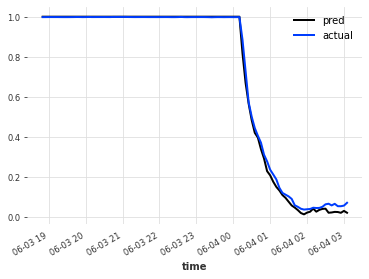

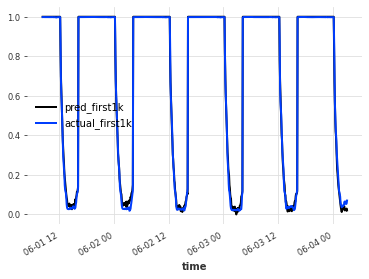

1334 1334


100%|██████████| 801/801 [00:13<00:00, 59.15it/s]


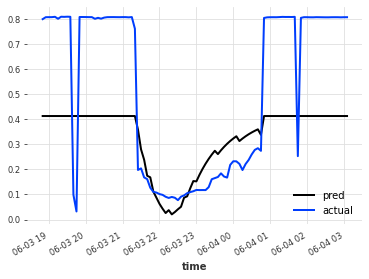

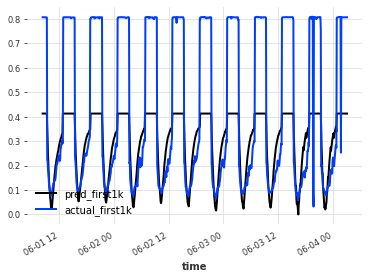

1334 1334


100%|██████████| 801/801 [00:12<00:00, 61.67it/s]


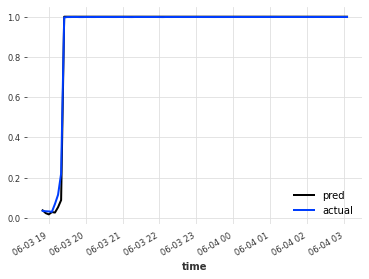

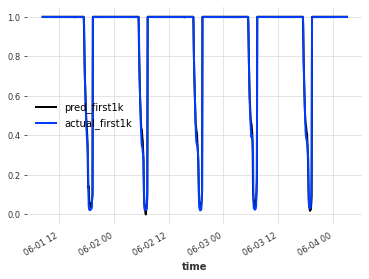

1334 1334


100%|██████████| 801/801 [00:13<00:00, 61.37it/s]


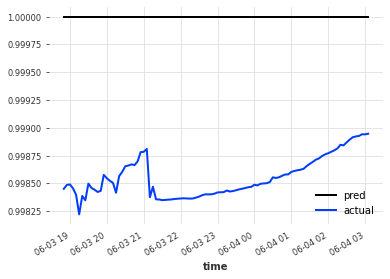

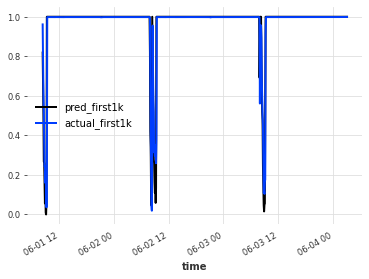

1334 1334


100%|██████████| 801/801 [00:13<00:00, 60.89it/s]


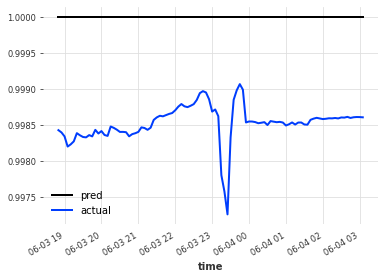

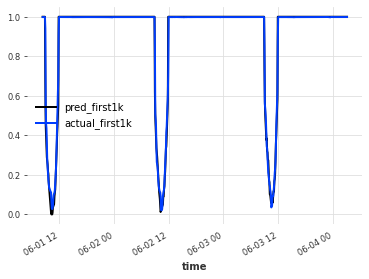

1334 1334


100%|██████████| 801/801 [00:13<00:00, 59.83it/s]


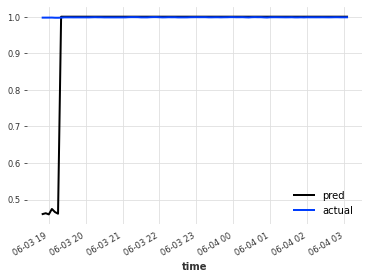

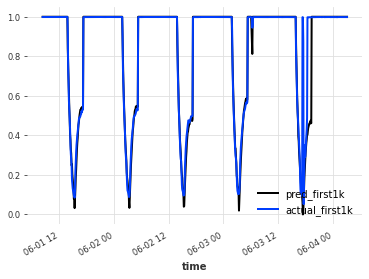

1334 1334


100%|██████████| 801/801 [00:13<00:00, 60.74it/s]


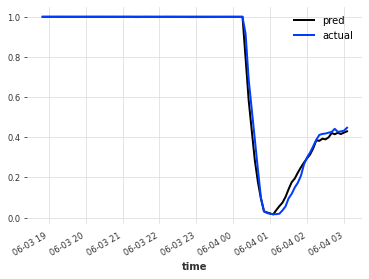

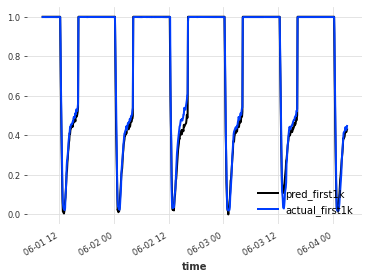

1334 1334


100%|██████████| 801/801 [00:13<00:00, 59.85it/s]


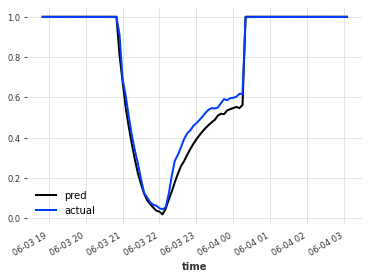

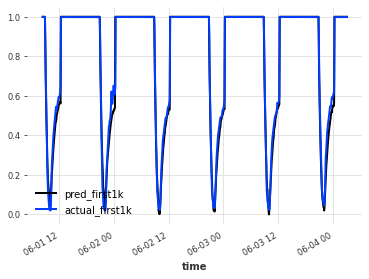

1334 1334


100%|██████████| 801/801 [00:13<00:00, 60.06it/s]


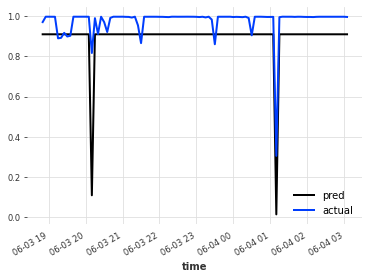

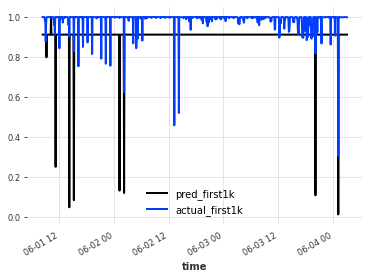

1334 1334


100%|██████████| 801/801 [00:13<00:00, 57.46it/s]


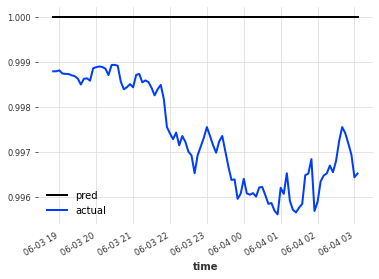

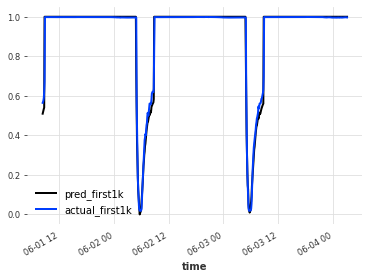

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.02it/s]


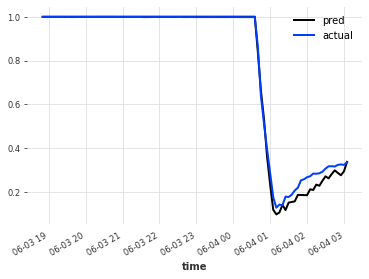

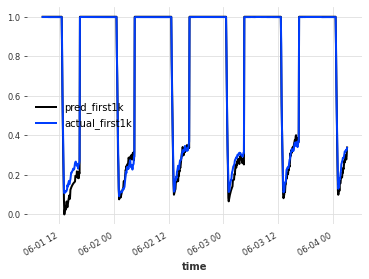

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.42it/s]


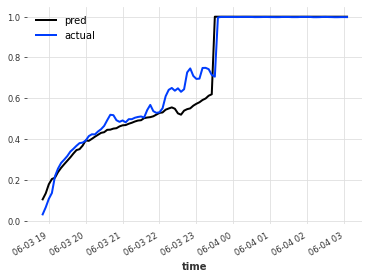

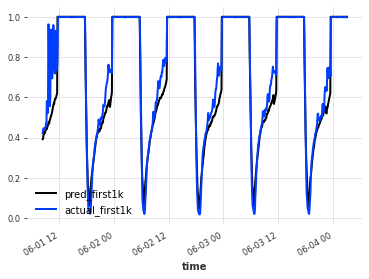

1334 1334


100%|██████████| 801/801 [00:14<00:00, 56.71it/s]


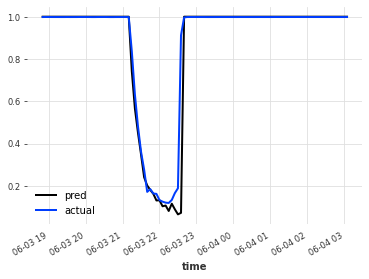

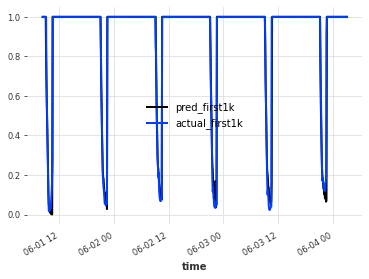

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.19it/s]


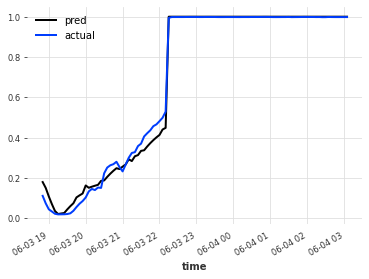

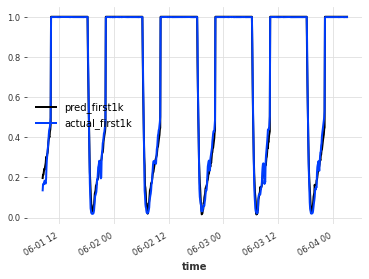

1334 1334


100%|██████████| 801/801 [00:13<00:00, 59.65it/s]


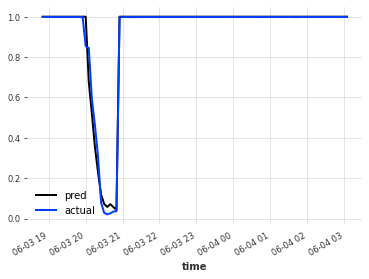

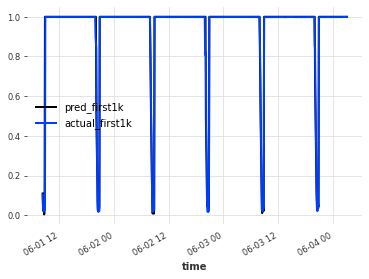

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.77it/s]


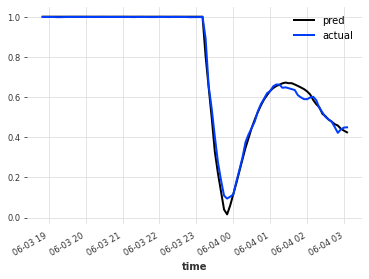

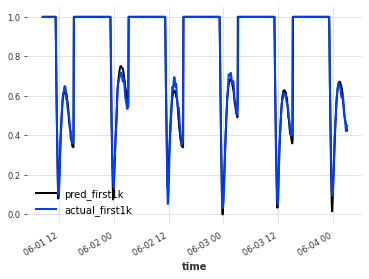

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.27it/s]


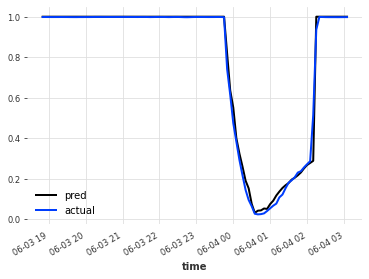

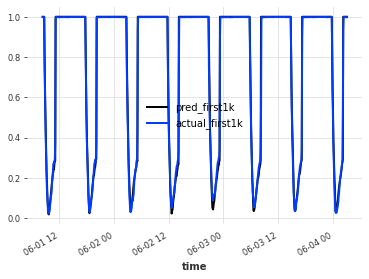

In [ ]:
results_for_valid2trans, true_valid2trans, predict__valid2trans = validate_model(model=trans_model,
                        validation_target=val_target2,
                        validation_cov=val_cov2)

In [ ]:
valid_trans = {'Valid1':{'true':true_valid1trans,
                      'prediction':predict__valid1trans},
             'Valid2':{'true':true_valid2trans,
                      'prediction':predict__valid2trans}}

In [ ]:
validtrans_results = score_model(valid_trans)
validtrans_results.loc['mean_transformers_valid'] = validtrans_results.mean()

validtrans_results.to_csv('transformers_valid_results.csv')
validtrans_results

,mape,smape,mae,r2_value
Valid1,1.476481e+11,0.056583,0.013816,0.969192
Valid2,4.802277e+11,0.084134,0.028411,0.937431
mean_transformers_valid,3.139379e+11,0.070359,0.021114,0.953311


# nbeats

In [ ]:
from darts.models import NBEATSModel


In [ ]:
model_nbeats = NBEATSModel(
    input_chunk_length=144,
    output_chunk_length=1,
    generic_architecture=True,
    num_stacks=10,
    num_blocks=1,
    num_layers=4,
    layer_widths=512,
    n_epochs=100,
    nr_epochs_val_period=1,
    batch_size=800,
    model_name='nbeats_allpumps'
)

In [ ]:
model_nbeats.fit(series=train_target_v3,
              past_covariates=train_cov_v3,
              val_series=val_target_v3,
              val_past_covariates=val_cov_v3,
              verbose=True)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

NameError: name 'exit' is not defined

In [ ]:
model_nbeats.save('allpumps_nbeats.pth.tar')

In [ ]:
from darts.models import NBEATSModel

model_nbeats = NBEATSModel.load("allpumps_nbeats.pth.tar")

In [ ]:
results_for_valid1nbeats, true_valid1nbeats, predict_valid1nbeats = validate_model(model=model_nbeats,
                        validation_target=val_target1,
                        validation_cov=val_cov1)

1667 1667


ValueError: The model has not been fitted yet, and `retrain` is ``False``. Either call `fit()` before `historical_forecasts()`, or set `retrain` to something different than ``False``.

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.49it/s]


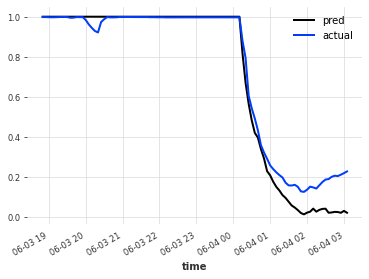

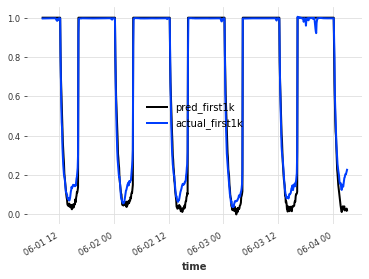

1334 1334


100%|██████████| 801/801 [00:12<00:00, 61.88it/s]


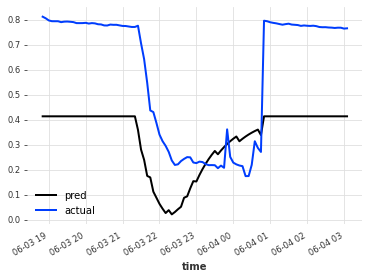

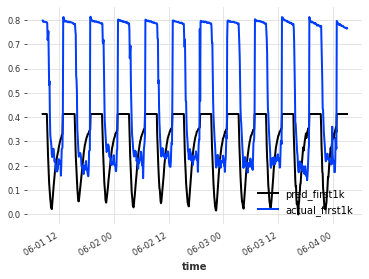

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.67it/s]


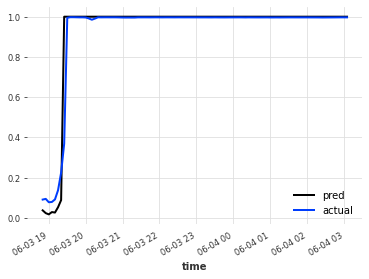

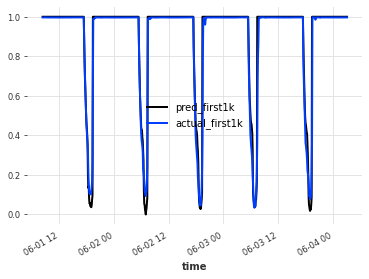

1334 1334


100%|██████████| 801/801 [00:12<00:00, 61.72it/s]


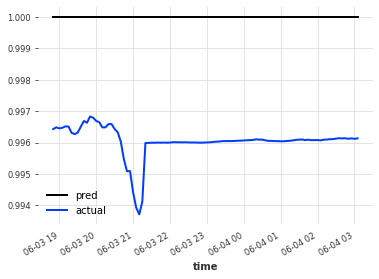

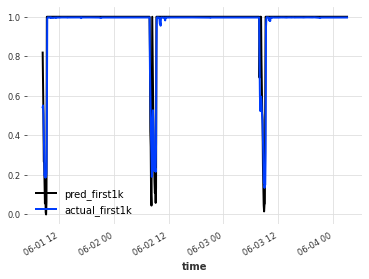

1334 1334


100%|██████████| 801/801 [00:13<00:00, 59.83it/s]


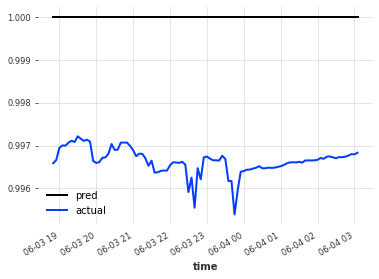

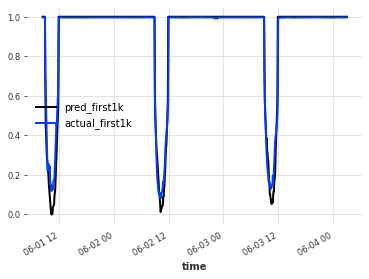

1334 1334


100%|██████████| 801/801 [00:14<00:00, 56.53it/s]


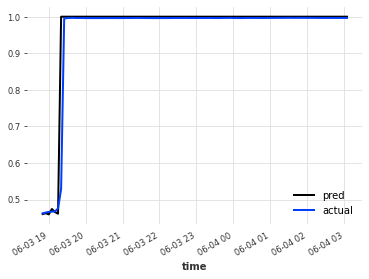

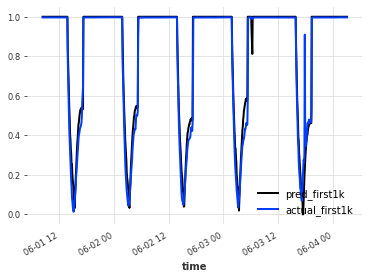

1334 1334


100%|██████████| 801/801 [00:13<00:00, 59.16it/s]


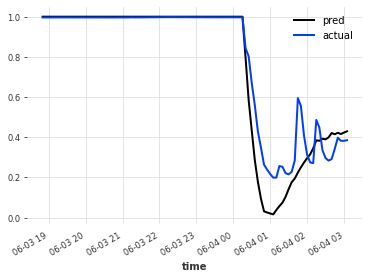

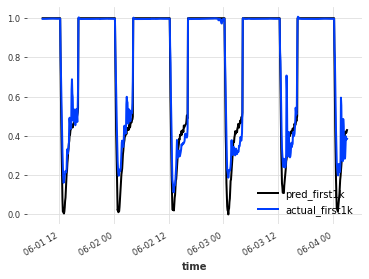

1334 1334


100%|██████████| 801/801 [00:13<00:00, 57.58it/s]


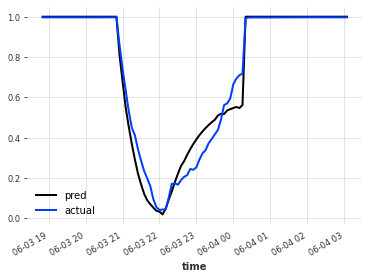

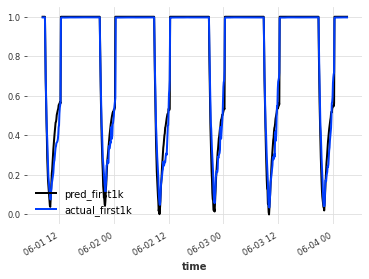

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.05it/s]


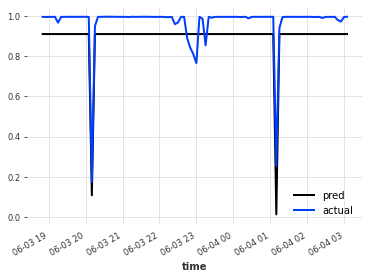

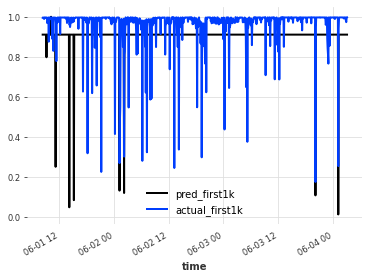

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.66it/s]


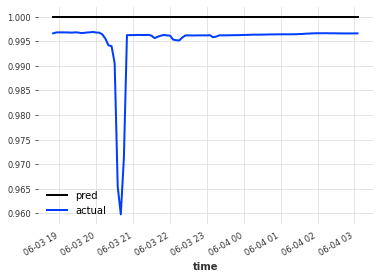

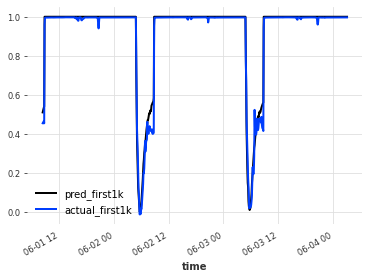

1334 1334


100%|██████████| 801/801 [00:13<00:00, 59.41it/s]


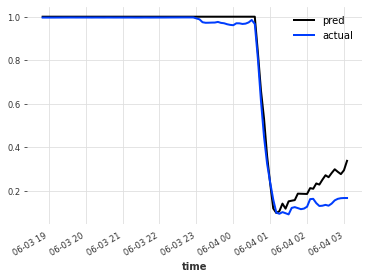

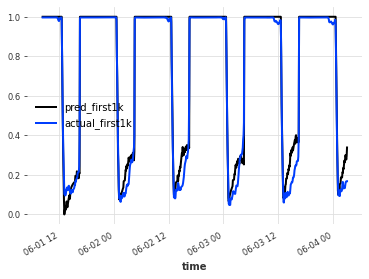

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.16it/s]


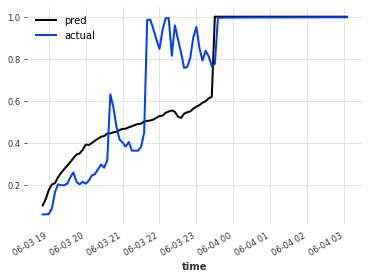

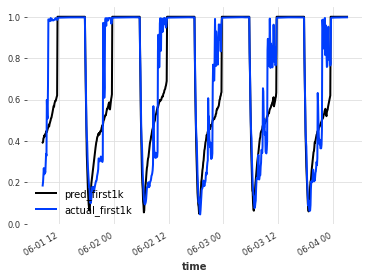

1334 1334


100%|██████████| 801/801 [00:13<00:00, 58.81it/s]


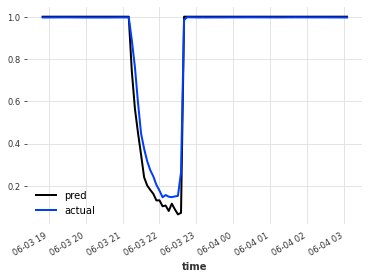

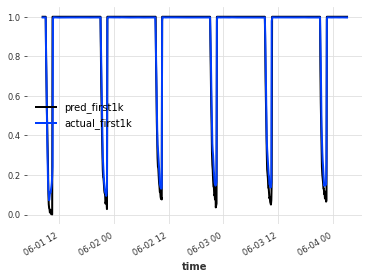

1334 1334


100%|██████████| 801/801 [00:13<00:00, 60.36it/s]


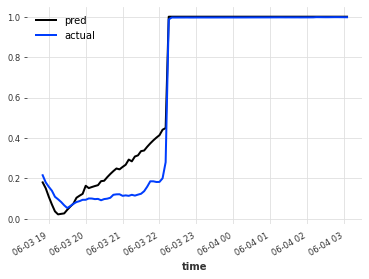

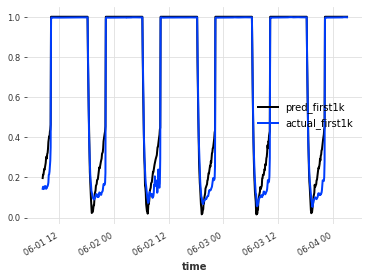

1334 1334


100%|██████████| 801/801 [00:14<00:00, 56.48it/s]


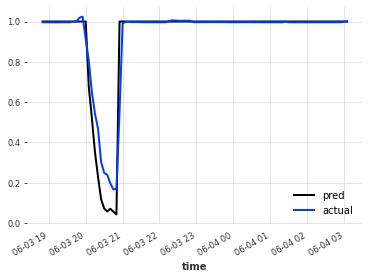

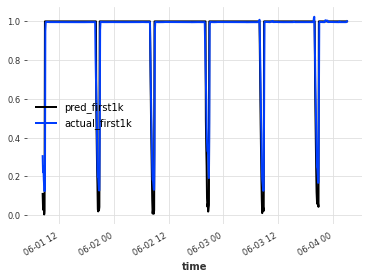

1334 1334


100%|██████████| 801/801 [00:13<00:00, 57.93it/s]


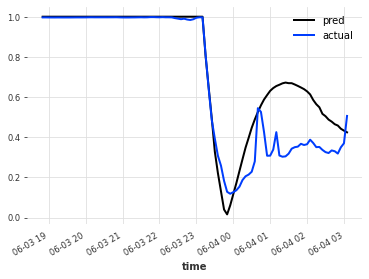

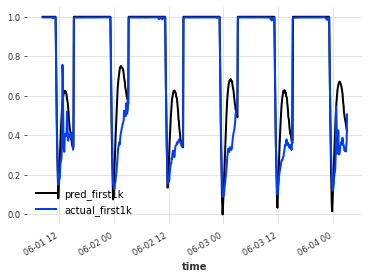

1334 1334


100%|██████████| 801/801 [00:13<00:00, 57.30it/s]


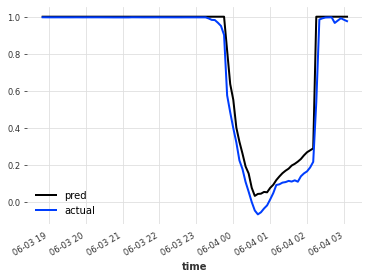

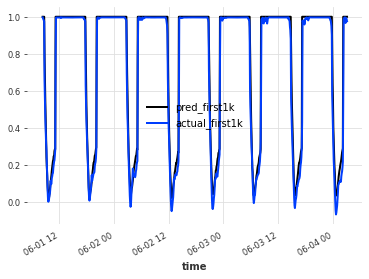

In [ ]:
results_for_valid2nbeats, true_valid2nbeats, predict_valid2nbeats  = validate_model(model=model_nbeats,
                        validation_target=val_target2,
                        validation_cov=val_cov2)

In [ ]:
valid_nbeats = {'Valid1':{'true':true_valid1nbeats,
                      'prediction':predict_valid1nbeats},
             'Valid2':{'true':true_valid2nbeats,
                      'prediction':predict_valid2nbeats}}

In [ ]:
valid_nbeats_results = score_model(valid_nbeats)
valid_nbeats_results.loc['mean_nbeats_valid'] = valid_nbeats_results.mean()

valid_nbeats_results.to_csv('nbeats_valid_results.csv')
valid_nbeats_results

,mape,smape,mae,r2_value
Valid1,2.937978e+11,0.123855,0.042314,0.901949
Valid2,4.271980e+11,0.144773,0.046362,0.897708
mean_nbeats_valid,3.604979e+11,0.134314,0.044338,0.899828
